In [1]:
# import os for traversing csv files
import os

# import tqdm for visualizing how long some loop will take
from tqdm import tqdm

# import pandas and numpy for math and data processing
import pandas as pd
import numpy as np

# import matplotlib and seaborn for plotting and visualizations
from matplotlib import pyplot as plt
import seaborn

# import gradient-boosted decision tree library - XGBoost
import xgboost as xgb

# import loss functions
from sklearn.metrics import brier_score_loss, mean_absolute_error

# import spline interpolation
from scipy.interpolate import UnivariateSpline

# options to suppress irrelevant errors and comprehensive display for pandas
pd.options.mode.chained_assignment = None 
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)

In [2]:
# Load the women's data and save as dataframes
W_regular_season_results = pd.read_csv("data/WRegularSeasonDetailedResults.csv")
W_tourney_results = pd.read_csv("data/WNCAATourneyDetailedResults.csv")
W_seeds = pd.read_csv("data/WNCAATourneySeeds.csv")
W_teams = pd.read_csv("data/WTeams.csv")

In [3]:
W_before_sweet = W_regular_season_results.copy(deep = True)
W_after_sweet = pd.DataFrame()

years = list(range(2010, 2026))
years.remove(2020)

for year in years:
    first_two_rounds = W_tourney_results[W_tourney_results["Season"]== year][:-15]
    sweet_onwards = W_tourney_results[W_tourney_results["Season"]== year][-15:]
    print(year, len(sweet_onwards), len(first_two_rounds))
    W_before_sweet = pd.concat([W_before_sweet, first_two_rounds])
    W_after_sweet = pd.concat([W_after_sweet, sweet_onwards])

print(len(W_before_sweet))
print(len(W_after_sweet))

2010 15 48
2011 15 48
2012 15 48
2013 15 48
2014 15 48
2015 15 48
2016 15 48
2017 15 48
2018 15 48
2019 15 48
2021 15 48
2022 15 52
2023 15 52
2024 15 52
2025 15 52
87923
225


In [4]:
# helper function to prepare data by normalizing statistics for overtime and duplicate each game from
# both teams' perspectives
def prepare_data(results_df):
    
    # remove WLoc from features - Location - Home (H), Away (A), Neutral (N)
    all_but_WLoc = ["Season", "DayNum", "LTeamID", "LScore", "WTeamID", "WScore", "NumOT",
            "LFGM", "LFGA", "LFGM3", "LFGA3", "LFTM", "LFTA", "LOR", "LDR", "LAst", "LTO", "LStl", "LBlk", "LPF",
            "WFGM", "WFGA", "WFGM3", "WFGA3", "WFTM", "WFTA", "WOR", "WDR", "WAst", "WTO", "WStl", "WBlk", "WPF"]
    
    results_df = results_df[all_but_WLoc]

    # creates a column for OT adjustment factor based on NumOT column
    ot_adjust = (40 + 5 * results_df["NumOT"]) / 40

    # specify stats which need to be adjusted
    cols_adjust = ["LScore", "WScore", 
               "LFGM", "LFGA", "LFGM3", "LFGA3", "LFTM", "LFTA", "LOR", "LDR", "LAst", "LTO", "LStl", "LBlk", "LPF",
               "WFGM", "WFGA", "WFGM3", "WFGA3", "WFTM", "WFTA", "WOR", "WDR", "WAst", "WTO", "WStl", "WBlk", "WPF"]

    # for each column that needs to be adjusted, adjust by corresponding adjustment factor
    for col in cols_adjust:
        results_df[col] = results_df[col] / ot_adjust

    # need to have a copy for each result for each team's persepctive (helpful during aggregation)
    # Use T1 and T2 for column standardization instead of W and L
    results_df_symmetric = results_df.copy()
    results_df.columns = [x.replace("W", "T1_").replace("L", "T2_") for x in list(results_df.columns)]
    results_df_symmetric.columns =  [x.replace("L", "T1_").replace("W", "T2_") for x in list(results_df_symmetric.columns)]

    # combine both perspective results
    combined = pd.concat([results_df, results_df_symmetric]).reset_index(drop = True)

    # add point differential for game
    combined["PointDiff"] = combined["T1_Score"] - combined["T2_Score"]

    # add indicator for win for game
    combined["win"] = (combined["PointDiff"] > 0) * 1

    return combined

W_before_sweet_data = prepare_data(W_before_sweet)

print("Women's Regular Season + First 2 Rounds Detailed Results:")
print(W_before_sweet_data)

W_sweet_onwards_data = prepare_data(W_after_sweet)

print("Women's Round 16 Onwards Tourney Detailed Results:")
print(W_sweet_onwards_data)

Women's Regular Season + First 2 Rounds Detailed Results:
        Season  DayNum  T2_TeamID   T2_Score  T1_TeamID   T1_Score  NumOT     T2_FGM     T2_FGA  T2_FGM3    T2_FGA3     T2_FTM     T2_FTA      T2_OR      T2_DR     T2_Ast      T2_TO     T2_Stl    T2_Blk      T2_PF     T1_FGM     T1_FGA    T1_FGM3    T1_FGA3     T1_FTM     T1_FTA      T1_OR      T1_DR  T1_Ast      T1_TO     T1_Stl     T1_Blk  T1_PF  PointDiff  win
0         2010      11       3237  49.000000       3103  63.000000      0  20.000000  54.000000      3.0  13.000000   6.000000  10.000000  11.000000  27.000000  11.000000  23.000000   7.000000  6.000000  19.000000  23.000000  54.000000   5.000000   9.000000  12.000000  19.000000  10.000000  26.000000    14.0  18.000000   7.000000   0.000000   15.0  14.000000    1
1         2010      11       3399  68.000000       3104  73.000000      0  25.000000  63.000000      4.0  21.000000  14.000000  27.000000  14.000000  26.000000   7.000000  20.000000   4.000000  2.000000  27.000

In [5]:
# Convert Seeds to integer
W_seeds["seed"] = W_seeds["Seed"].apply(lambda x: int(x[1:3]))
W_seeds

,Season,Seed,TeamID,seed
0,1998,W01,3330,1
1,1998,W02,3163,2
2,1998,W03,3112,3
3,1998,W04,3301,4
4,1998,W05,3272,5
...,...,...,...,...
1807,2026,Z12,3211,12
1808,2026,Z13,3453,13
1809,2026,Z14,3158,14
1810,2026,Z15,3239,15


In [6]:
# Join a table that displays each tournament matchup along with the:
#   - outcome, point differential, each team's seed, and the seed differential

T1_seeds = W_seeds[["Season", "TeamID", "seed"]].copy()
T2_seeds = W_seeds[["Season", "TeamID", "seed"]].copy()

T1_seeds.columns = ["Season", "T1_TeamID", "T1_seed"]
T2_seeds.columns = ["Season", "T2_TeamID", "T2_seed"]

W_sweet_onwards_data = W_sweet_onwards_data[["Season", "T1_TeamID", "T2_TeamID", "PointDiff", "win"]]

W_sweet_onwards_data = pd.merge(W_sweet_onwards_data, T1_seeds, on=["Season", "T1_TeamID"], how = "left")
W_sweet_onwards_data = pd.merge(W_sweet_onwards_data, T2_seeds, on=["Season", "T2_TeamID"], how = "left")

W_sweet_onwards_data["seed_Diff"] = W_sweet_onwards_data["T2_seed"] - W_sweet_onwards_data["T1_seed"]
W_sweet_onwards_data

,Season,T1_TeamID,T2_TeamID,PointDiff,win,T1_seed,T2_seed,seed_Diff
0,2010,3124,3397,15.0,1,4,1,-3
1,2010,3181,3361,8.0,1,2,11,9
2,2010,3390,3208,37.0,1,1,5,4
3,2010,3462,3211,18.0,1,3,7,4
4,2010,3163,3235,38.0,1,1,4,3
...,...,...,...,...,...,...,...,...
445,2025,3425,3163,-14.0,0,1,2,1
446,2025,3395,3400,-11.0,0,2,1,-1
447,2025,3417,3163,-34.0,0,1,2,1
448,2025,3400,3376,-17.0,0,1,1,0


Text(0.5, 1.0, 'Point Differential v. Seed')

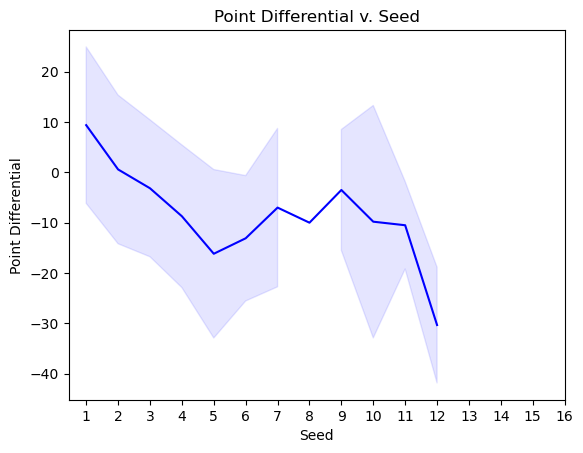

In [7]:
# Visualize how good of a metric seed is for predicting outcome
mu_seed = W_sweet_onwards_data.pivot_table(index = "T1_seed", values = "PointDiff", aggfunc = "mean").ffill()
sigma_seed =  W_sweet_onwards_data.pivot_table(index = "T1_seed", values = "PointDiff", aggfunc = "std").ffill()

bottom = list((mu_seed - sigma_seed)['PointDiff'])
top = list((mu_seed + sigma_seed)['PointDiff'])

plt.plot(mu_seed.index, mu_seed, 'b-')
plt.fill_between(mu_seed.index,bottom, top, color="b", alpha=0.1)
plt.xlabel('Seed')
plt.ylabel('Point Differential')
plt.xticks(list(range(1,17)))
plt.title("Point Differential v. Seed")

Text(0.5, 1.0, 'Point Differential v. Seed Differential')

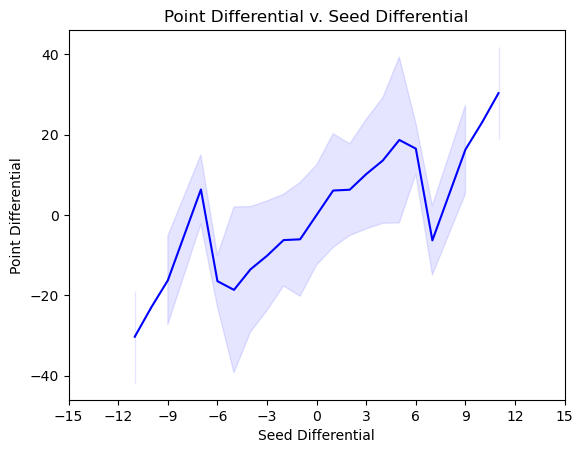

In [9]:
# Visualize how good of a metrics seed differential is for predicting outcome
mu_seed_diff = W_sweet_onwards_data.pivot_table(index = "seed_Diff", values = "PointDiff", aggfunc = "mean").ffill()
sigma_seed_diff =  W_sweet_onwards_data.pivot_table(index = "seed_Diff", values = "PointDiff", aggfunc = "std").ffill()

bottom = list((mu_seed_diff - sigma_seed_diff)['PointDiff'])
top = list((mu_seed_diff + sigma_seed_diff)['PointDiff'])

plt.plot(mu_seed_diff.index, mu_seed_diff, 'b-')
plt.fill_between(mu_seed_diff.index,bottom, top, color="b", alpha=0.1)
plt.xlabel('Seed Differential')
plt.ylabel('Point Differential')
plt.xticks(list(range(-15,16,3)))
plt.title("Point Differential v. Seed Differential")

In [10]:
import numpy as np

def pagerank(M, d: float = 0.85):
    """PageRank Algorithm that treats teams as nodes, and outcome in their games as a link
    If Team a loses to Team b >= 1 time during the regular season, 
        This is an event where we demarcate power flow from Team a to Team b
        For Team A, we consider all its losses during the season
            For multiple losses against same team, take average point differential to aggregate
            Compute sum of all margins of loss and normalize each differential with that sum
            Set its column vector based on those calculations
                Team A loses to Team B by avg of 7.5 pts p game during regular season:
                    Entry at column A, Row B of 7.5 / total differential across all losses 
                    (accounting for normalization for losses to same team)
    
    Use the Power Calculation, applying fundamentals of linear algebra

    Parameters
    ----------
    M : numpy array
        adjacency matrix where M_i,j represents the link from 'j' to 'i', such that for all 'j'
        sum(i, M_i,j) = 1

    d : float, optional
        damping factor

    Returns
    -------
    numpy array
        a vector of ranks such that v_i is the i-th rank score (takes on values from  [0, 1]),
        the sum of the values in this array is 1.0

    """
    N = M.shape[1]
    w = np.ones(N) / N
    M_hat = d * M
    v = M_hat @ w + (1 - d) / N
    while np.linalg.norm(w - v) >= 1e-20:
        w = v
        v = M_hat @ w + (1 - d) / N
    return v

In [12]:
def get_pagerank_info(year):
    return W_before_sweet[W_before_sweet["Season"] == year][["WTeamID", "WScore", "LTeamID", "LScore"]]

years = list(range(2010, 2026))
years.remove(2020)

W_pagerank = pd.DataFrame()

for year_idx in tqdm(range(len(years))):

    year = years[year_idx]

    distinct_team_ids = []
    winner_id_list = get_pagerank_info(year)["WTeamID"].tolist()

    loser_id_list = get_pagerank_info(year)["LTeamID"].tolist()


    id_list = list(set(winner_id_list + loser_id_list))
    idx_map = dict()


    for i in range(len(id_list)):
        idx_map[id_list[i]] = i

    N = len(id_list)

    M = np.zeros((N, N))

    for curr_team in id_list:

        df = get_pagerank_info(year)

        loss_res = df[df["LTeamID"] == curr_team]

        loss_res["Diff"] = loss_res["WScore"] - loss_res["LScore"]
        loss_res["Opp_Team"] = loss_res["WTeamID"]
        loss_res['Curr_Team'] = curr_team
        loss_res = loss_res.reset_index()

        loss_res['Avg_Diff'] = loss_res.groupby(['Curr_Team', 'Opp_Team'])['Diff'].transform('mean')
        loss_res = loss_res.drop_duplicates(['Curr_Team', 'Opp_Team'])

        total_loss_diff = loss_res['Avg_Diff'].sum()

        loss_res['Norm_Diff'] = loss_res['Avg_Diff'] / total_loss_diff

        loss_res = loss_res[['Curr_Team', 'Opp_Team', 'Norm_Diff']]

        for index, row in loss_res.iterrows():
            c = idx_map[curr_team]
            r = idx_map[int(row['Opp_Team'])]
            M[r, c] += row['Norm_Diff']

    v = pagerank(M, 0.1) # between 0 and 1

    idx_power_list = []

    for i, x in enumerate(v):
        idx_power_list.append((i,x))

    idx_power_list.sort(key = lambda x: x[1], reverse = True)

    W_pagerank_year = pd.DataFrame({'PR_Power' : [x[1] for x in idx_power_list], 'TeamID' : [id_list[x[0]] for x in idx_power_list]})
    W_pagerank_year['Season'] = year

    W_pagerank = pd.concat([W_pagerank, W_pagerank_year])

100%|██████████| 15/15 [00:14<00:00,  1.06it/s]


In [13]:
W_pagerank

,PR_Power,TeamID,Season
0,0.005638,3163,2010
1,0.004313,3390,2010
2,0.004155,3401,2010
3,0.003986,3304,2010
4,0.003885,3181,2010
...,...,...,...
357,0.002497,3175,2025
358,0.002493,3354,2025
359,0.002493,3310,2025
360,0.002491,3421,2025


In [14]:
T1_PR = W_pagerank[["Season", "TeamID", "PR_Power"]].copy()
T2_PR = W_pagerank[["Season", "TeamID", "PR_Power"]].copy()

T1_PR.columns = ["Season", "T1_TeamID", "T1_PageRank"]
T2_PR.columns = ["Season", "T2_TeamID", "T2_PageRank"]

W_sweet_onwards_data_slice = W_sweet_onwards_data[["Season", "T1_TeamID", "T2_TeamID", "PointDiff", "win"]]

W_sweet_onwards_data_slice = pd.merge(W_sweet_onwards_data_slice, T1_PR, on=["Season", "T1_TeamID"], how = "left")
W_sweet_onwards_data_slice = pd.merge(W_sweet_onwards_data_slice, T2_PR, on=["Season", "T2_TeamID"], how = "left")

W_sweet_onwards_data_slice["PageRank_Diff"] = W_sweet_onwards_data_slice["T2_PageRank"] - W_sweet_onwards_data_slice["T1_PageRank"]
W_sweet_onwards_data = pd.merge(W_sweet_onwards_data, W_sweet_onwards_data_slice, on = ["Season", "T1_TeamID", "T2_TeamID", "PointDiff", "win"], how = "left")
W_sweet_onwards_data

,Season,T1_TeamID,T2_TeamID,PointDiff,win,T1_seed,T2_seed,seed_Diff,T1_PageRank,T2_PageRank,PageRank_Diff
0,2010,3124,3397,15.0,1,4,1,-3,0.003775,0.003848,0.000072
1,2010,3181,3361,8.0,1,2,11,9,0.003885,0.003273,-0.000612
2,2010,3390,3208,37.0,1,1,5,4,0.004313,0.003336,-0.000977
3,2010,3462,3211,18.0,1,3,7,4,0.003443,0.003449,0.000007
4,2010,3163,3235,38.0,1,1,4,3,0.005638,0.003418,-0.002220
...,...,...,...,...,...,...,...,...,...,...,...
445,2025,3425,3163,-14.0,0,1,2,1,0.003997,0.004282,0.000285
446,2025,3395,3400,-11.0,0,2,1,-1,0.003549,0.004171,0.000621
447,2025,3417,3163,-34.0,0,1,2,1,0.004019,0.004282,0.000263
448,2025,3400,3376,-17.0,0,1,1,0,0.004171,0.004580,0.000410


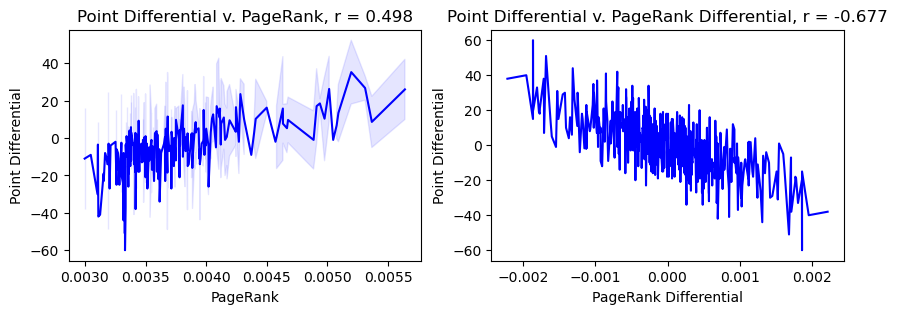

In [15]:
# Helper function that takes in a stat_name and start_year as input
# Plots and Displays Point Differential v. Raw Stat and Point Differential v. Stat Differential
def visualize_stat_correlation(stat_name, start_year = 2003):

    # Visualize how good of a metric the raw stat is for predicting outcome

    subset_tourney_data = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] >= start_year].copy()

    corr_df = subset_tourney_data[["PointDiff", f"T1_{stat_name}"]].copy()
    r = corr_df.corr().iloc[0,1]

    mu_stat = subset_tourney_data.pivot_table(index = f"T1_{stat_name}", values = "PointDiff", aggfunc = "mean").ffill()
    sigma_stat = subset_tourney_data.pivot_table(index = f"T1_{stat_name}", values = "PointDiff", aggfunc = "std").ffill()

    bottom = list((mu_stat - sigma_stat)['PointDiff'])
    top = list((mu_stat + sigma_stat)['PointDiff'])

    fig, axs = plt.subplots(1, 2)
    fig.set_figheight(3)
    fig.set_figwidth(10)

    condensed_stat_name = stat_name if not "opponent" in stat_name else stat_name[:7] + stat_name[12:]

    axs[0].plot(mu_stat.index, mu_stat, 'b-')
    axs[0].fill_between(mu_stat.index,bottom, top, color="b", alpha=0.1)
    axs[0].set_xlabel(condensed_stat_name)
    axs[0].set_ylabel('Point Differential')
    axs[0].set_title(f"Point Differential v. {condensed_stat_name}, r = {r:.3f}")

    # Visualize how good of a metrics stat differential is for predicting outcome

    subset_tourney_data[f"{stat_name}_Diff"] = subset_tourney_data[f"T2_{stat_name}"] -  subset_tourney_data[f"T1_{stat_name}"]

    corr_diff_df = subset_tourney_data[["PointDiff", f"{stat_name}_Diff"]].copy()
    r_diff = corr_diff_df.corr().iloc[0,1]

    mu_seed_diff = subset_tourney_data.pivot_table(index = f"{stat_name}_Diff", values = "PointDiff", aggfunc = "mean").ffill()
    sigma_seed_diff =  subset_tourney_data.pivot_table(index = f"{stat_name}_Diff", values = "PointDiff", aggfunc = "std").ffill()

    bottom = list((mu_seed_diff - sigma_seed_diff)['PointDiff'])
    top = list((mu_seed_diff + sigma_seed_diff)['PointDiff'])

    axs[1].plot(mu_seed_diff.index, mu_seed_diff, 'b-')
    axs[1].fill_between(mu_seed_diff.index,bottom, top, color="b", alpha=0.1)
    axs[1].set_xlabel(f'{condensed_stat_name} Differential')
    axs[1].set_ylabel('Point Differential')
    axs[1].set_title(f"Point Differential v. {condensed_stat_name} Differential, r = {r_diff:.3f}")

    plt.show()

visualize_stat_correlation("PageRank")

In [16]:
W_sweet_onwards_data

,Season,T1_TeamID,T2_TeamID,PointDiff,win,T1_seed,T2_seed,seed_Diff,T1_PageRank,T2_PageRank,PageRank_Diff
0,2010,3124,3397,15.0,1,4,1,-3,0.003775,0.003848,0.000072
1,2010,3181,3361,8.0,1,2,11,9,0.003885,0.003273,-0.000612
2,2010,3390,3208,37.0,1,1,5,4,0.004313,0.003336,-0.000977
3,2010,3462,3211,18.0,1,3,7,4,0.003443,0.003449,0.000007
4,2010,3163,3235,38.0,1,1,4,3,0.005638,0.003418,-0.002220
...,...,...,...,...,...,...,...,...,...,...,...
445,2025,3425,3163,-14.0,0,1,2,1,0.003997,0.004282,0.000285
446,2025,3395,3400,-11.0,0,2,1,-1,0.003549,0.004171,0.000621
447,2025,3417,3163,-34.0,0,1,2,1,0.004019,0.004282,0.000263
448,2025,3400,3376,-17.0,0,1,1,0,0.004171,0.004580,0.000410


In [17]:
# list which stats we want to aggregate acros the season for each team 
#   - calculate all interesting features
box_score_stats = [
    "T1_Score", "T1_FGM", "T1_FGA", "T1_FGM3", "T1_FGA3", "T1_FTM", "T1_FTA",
    "T1_OR", "T1_DR", "T1_Ast", "T1_TO", "T1_Stl", "T1_Blk", "T1_PF",
    "T2_Score", "T2_FGM", "T2_FGA", "T2_FGM3", "T2_FGA3", "T2_FTM", "T2_FTA",
    "T2_OR", "T2_DR", "T2_Ast", "T2_TO", "T2_Stl", "T2_Blk", "T2_PF",
    "PointDiff"
]

In [18]:
# aggregate the average statistics for every team across the season and concatenate the corresponding
# columns on the tournament matchup data
season_stats = W_before_sweet_data.groupby(["Season", "T1_TeamID"])[box_score_stats].agg("mean").reset_index()

season_stats_T1 = season_stats.copy()
season_stats_T1.columns = ["T1_avg_" + x.replace("T1_", "").replace("T2_", "opponent_") for x in list(season_stats_T1.columns)]
season_stats_T1 = season_stats_T1.rename({"T1_avg_Season" : "Season", "T1_avg_TeamID" : "T1_TeamID"}, axis = 1)

season_stats_T2 = season_stats.copy()
season_stats_T2.columns = ["T2_avg_" + x.replace("T1_", "").replace("T2_", "opponent_") for x in list(season_stats_T2.columns)]
season_stats_T2 = season_stats_T2.rename({"T2_avg_Season" : "Season", "T2_avg_TeamID" : "T2_TeamID"}, axis = 1)

W_sweet_onwards_data = pd.merge(W_sweet_onwards_data, season_stats_T1, on = ["Season", "T1_TeamID"], how = "left")
W_sweet_onwards_data = pd.merge(W_sweet_onwards_data, season_stats_T2, on = ["Season", "T2_TeamID"], how = "left")
W_sweet_onwards_data

,Season,T1_TeamID,T2_TeamID,PointDiff,win,T1_seed,T2_seed,seed_Diff,T1_PageRank,T2_PageRank,PageRank_Diff,T1_avg_Score,T1_avg_FGM,T1_avg_FGA,T1_avg_FGM3,T1_avg_FGA3,T1_avg_FTM,T1_avg_FTA,T1_avg_OR,T1_avg_DR,T1_avg_Ast,T1_avg_TO,T1_avg_Stl,T1_avg_Blk,T1_avg_PF,T1_avg_opponent_Score,T1_avg_opponent_FGM,T1_avg_opponent_FGA,T1_avg_opponent_FGM3,T1_avg_opponent_FGA3,T1_avg_opponent_FTM,T1_avg_opponent_FTA,T1_avg_opponent_OR,T1_avg_opponent_DR,T1_avg_opponent_Ast,T1_avg_opponent_TO,T1_avg_opponent_Stl,T1_avg_opponent_Blk,T1_avg_opponent_PF,T1_avg_PointDiff,T2_avg_Score,T2_avg_FGM,T2_avg_FGA,T2_avg_FGM3,T2_avg_FGA3,T2_avg_FTM,T2_avg_FTA,T2_avg_OR,T2_avg_DR,T2_avg_Ast,T2_avg_TO,T2_avg_Stl,T2_avg_Blk,T2_avg_PF,T2_avg_opponent_Score,T2_avg_opponent_FGM,T2_avg_opponent_FGA,T2_avg_opponent_FGM3,T2_avg_opponent_FGA3,T2_avg_opponent_FTM,T2_avg_opponent_FTA,T2_avg_opponent_OR,T2_avg_opponent_DR,T2_avg_opponent_Ast,T2_avg_opponent_TO,T2_avg_opponent_Stl,T2_avg_opponent_Blk,T2_avg_opponent_PF,T2_avg_PointDiff
0,2010,3124,3397,15.0,1,4,1,-3,0.003775,0.003848,0.000072,71.127451,25.771242,55.715686,2.346405,8.369281,17.238562,23.905229,12.032680,30.947712,14.725490,16.816993,6.954248,7.316993,13.908497,55.885621,20.767974,62.535948,5.575163,20.254902,8.774510,12.823529,12.934641,21.676471,9.522876,15.663399,6.591503,1.937908,19.310458,15.241830,74.647059,28.794118,61.911765,5.352941,14.176471,11.705882,17.470588,15.500000,27.941176,15.794118,14.676471,6.882353,6.558824,14.911765,56.470588,20.588235,59.470588,5.558824,17.735294,9.735294,14.323529,13.000000,20.764706,10.294118,15.941176,6.558824,2.852941,16.735294,18.176471
1,2010,3181,3361,8.0,1,2,11,9,0.003885,0.003273,-0.000612,71.264706,26.705882,63.205882,4.441176,14.294118,13.411765,20.088235,17.382353,25.705882,14.000000,17.735294,13.264706,5.264706,17.441176,54.441176,18.764706,53.500000,5.176471,16.264706,11.735294,17.588235,12.264706,21.882353,11.205882,22.970588,7.529412,3.323529,17.852941,16.823529,65.164983,25.225589,56.525253,4.407407,12.804714,10.306397,14.794613,13.740741,22.437710,15.744108,18.713805,9.303030,5.316498,15.818182,57.377104,21.565657,55.518519,3.461279,12.808081,10.784512,15.828283,13.909091,19.760943,11.959596,19.208754,8.838384,3.178451,14.252525,7.787879
2,2010,3390,3208,37.0,1,1,5,4,0.004313,0.003336,-0.000977,77.735294,28.617647,60.058824,6.441176,18.529412,14.058824,19.117647,14.323529,30.411765,17.941176,14.176471,5.470588,4.352941,13.117647,54.147059,21.117647,61.941176,4.117647,16.058824,7.794118,12.500000,12.500000,20.147059,9.529412,13.441176,5.882353,2.176471,17.176471,23.588235,62.713805,22.222222,57.158249,4.979798,17.144781,13.289562,20.023569,15.013468,25.232323,11.855219,16.154882,8.363636,5.404040,14.488215,54.585859,19.744108,57.343434,5.713805,19.528620,9.383838,13.491582,14.164983,23.434343,10.855219,17.824916,7.259259,3.545455,17.521886,8.127946
3,2010,3462,3211,18.0,1,3,7,4,0.003443,0.003449,0.000007,71.698925,26.913978,59.817204,5.810036,16.620072,12.060932,17.953405,15.215054,28.433692,15.623656,16.215054,7.577061,5.186380,14.379928,56.419355,20.322581,58.408602,6.548387,21.609319,9.225806,13.878136,11.591398,20.917563,11.720430,15.670251,8.616487,2.824373,16.351254,15.279570,80.457912,31.730640,66.491582,4.925926,15.023569,12.070707,16.373737,14.572391,26.794613,19.286195,15.626263,11.060606,4.710438,14.784512,58.353535,21.437710,59.461279,4.737374,15.919192,10.740741,16.094276,13.882155,22.872054,10.848485,21.939394,7.744108,3.050505,15.841751,22.104377
4,2010,3163,3235,38.0,1,1,4,3,0.005638,0.003418,-0.002220,82.000000,31.352941,60.382353,5.911765,16.794118,13.382353,18.352941,13.000000,31.088235,19.764706,14.970588,9.352941,5.705882,12.323529,46.588235,17.794118,59.117647,4.117647,17.470588,6.882353,11.058824,12.205882,18.823529,8.735294,18.882353,7.382353,2.147059,17.088235,35.411765,65.896296,22.837037,53.040741,7.862963,20.674074,12.359259,16.722222,12.548148,25.351852,14.314815,14.144444,5.540741,2.625926,14.318519,53.070370,18.722222,

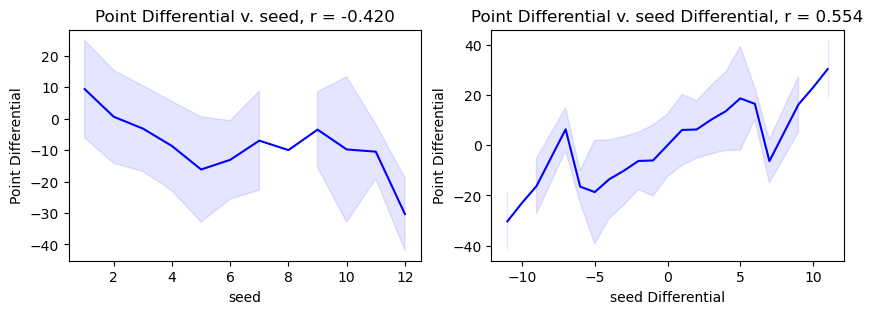

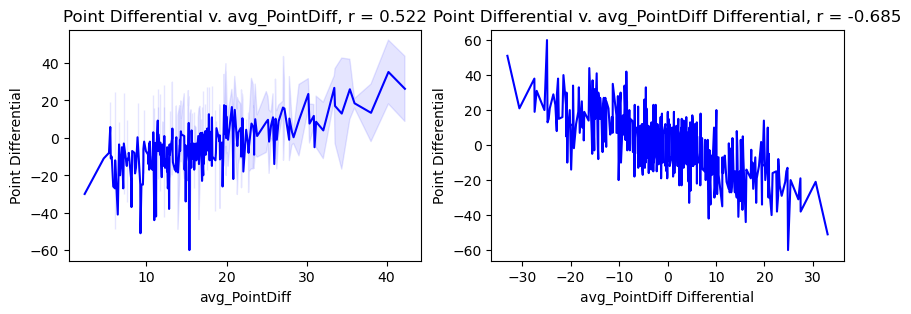

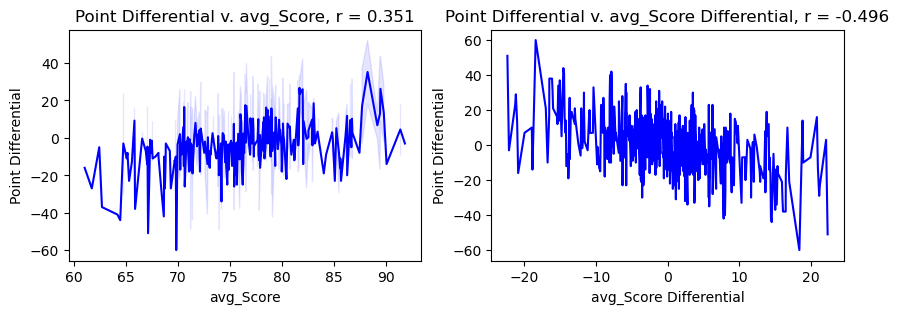

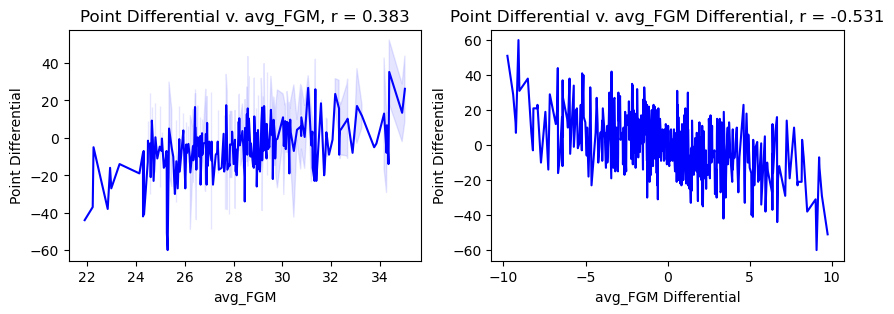

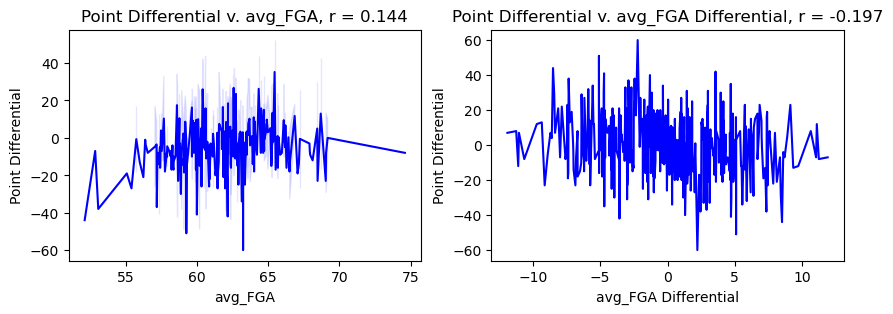

...

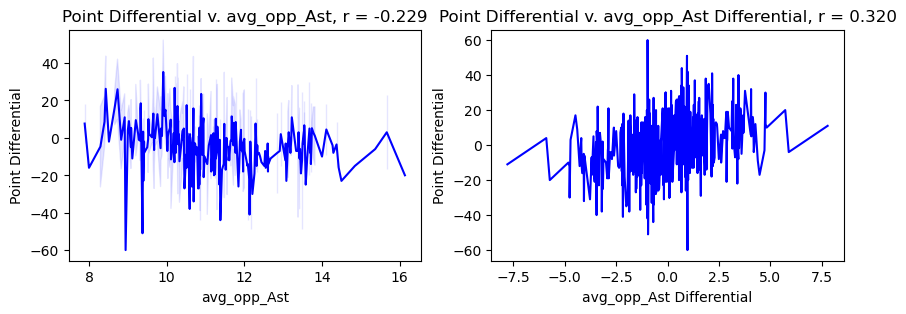

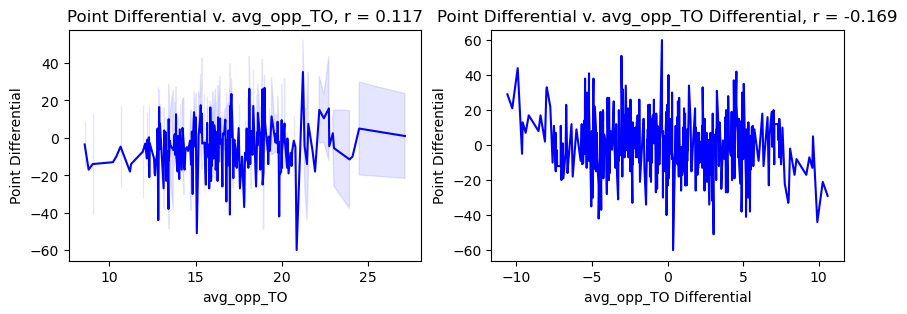

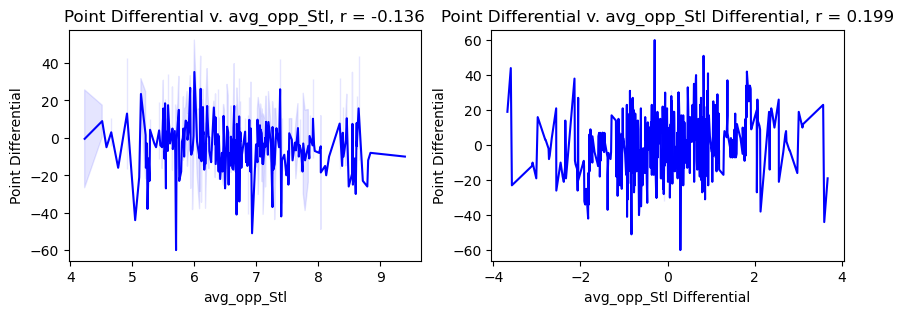

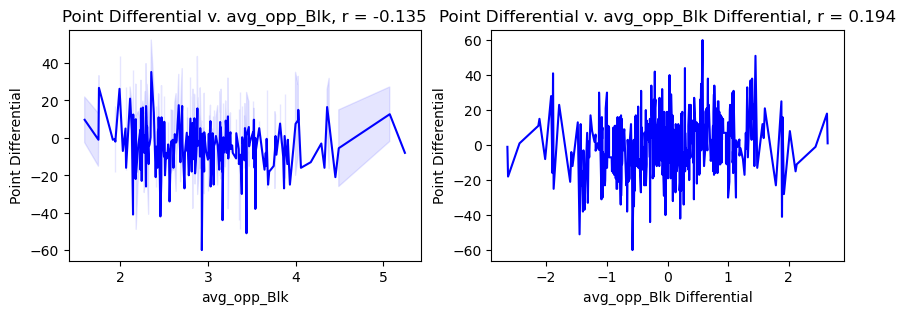

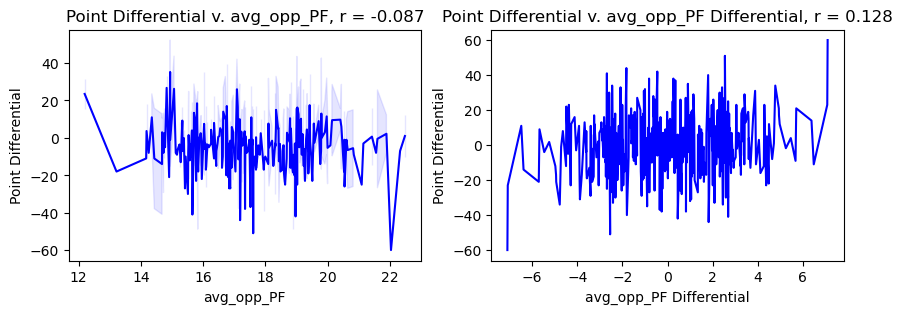

In [19]:
my_stats = ["seed", "avg_PointDiff", 'avg_Score', "avg_FGM", "avg_FGA", "avg_FGM3", "avg_FGA3", 
            "avg_FTM", "avg_FTA", 'avg_OR', "avg_DR", "avg_Ast", "avg_TO", "avg_Stl", 
            "avg_Blk", "avg_PF"]

opponent_stats = [stat[:4] + "opponent_" + stat[4:] for stat in my_stats[2:]]

for statistic in my_stats:
    visualize_stat_correlation(statistic)

for statistic in opponent_stats:
    visualize_stat_correlation(statistic)

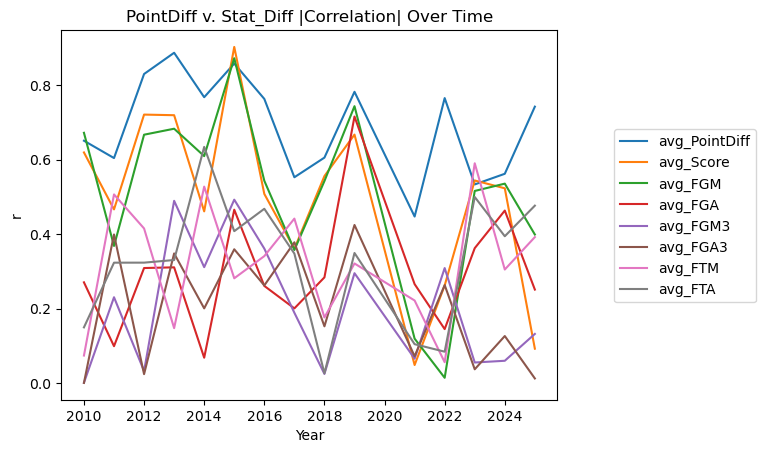

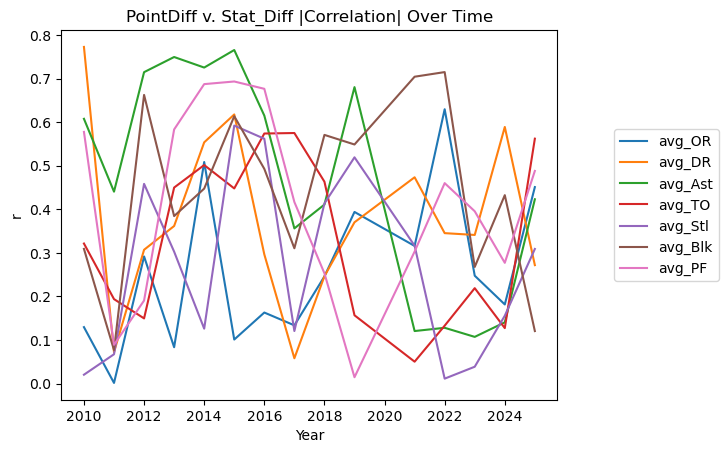

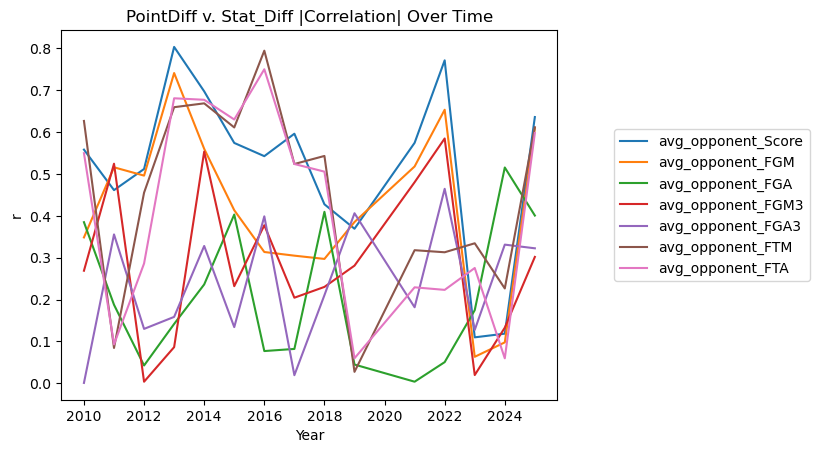

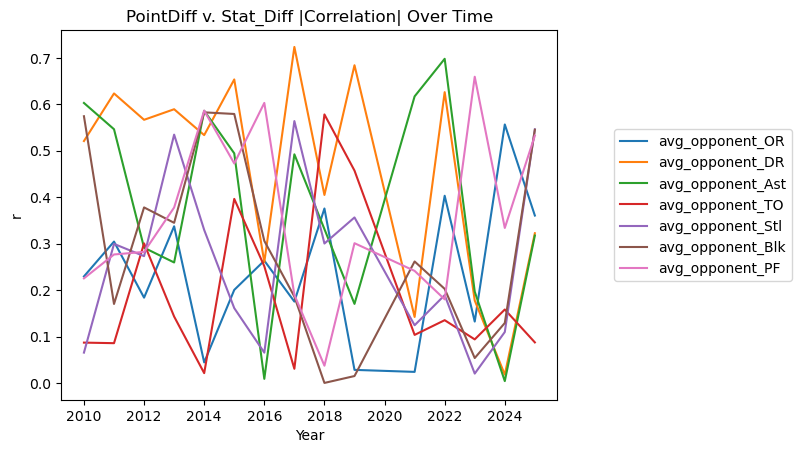

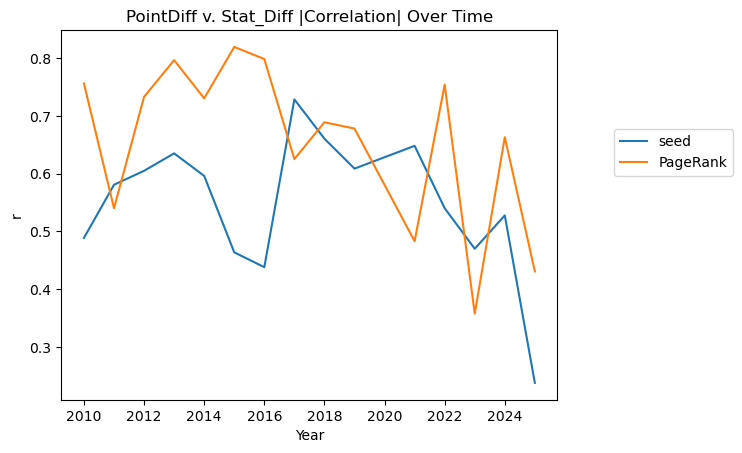

In [21]:
# Helper function that takes in a stat_name and start_year as input
# Plots and Displays Point Differential v. Raw Stat and Point Differential v. Stat Differential
def visualize_stat_correlation_over_time(stat_list):

    for stat_name in stat_list:

        years = list(range(2003, 2026))
        years.remove(2020)

        r_list = []

        for year in years:

            subset_tourney_data = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == year].copy()

            subset_tourney_data[f"{stat_name}_Diff"] = subset_tourney_data[f"T2_{stat_name}"] -  subset_tourney_data[f"T1_{stat_name}"]

            corr_diff_df = subset_tourney_data[["PointDiff", f"{stat_name}_Diff"]].copy()
            r_diff = corr_diff_df.corr().iloc[0,1]

            r_list.append(abs(r_diff))

        plt.plot(years, r_list, label = stat_name)
    
    plt.title(f"PointDiff v. Stat_Diff |Correlation| Over Time")
    plt.ylabel("r")
    plt.xlabel("Year")
    plt.legend(bbox_to_anchor = (1.1, 0.75))
    plt.show()


score_stats =  ["avg_PointDiff", 'avg_Score', "avg_FGM", "avg_FGA", "avg_FGM3", "avg_FGA3", 
            "avg_FTM", "avg_FTA"]

non_score_stats = ['avg_OR', "avg_DR", "avg_Ast", "avg_TO", "avg_Stl", 
            "avg_Blk", "avg_PF"]

rank_stats = ['seed', 'PageRank']

opp_score_stats = [stat[:4] + "opponent_" + stat[4:] for stat in score_stats[1:]]
opp_non_score_stats = [stat[:4] + "opponent_" + stat[4:] for stat in non_score_stats]

visualize_stat_correlation_over_time(score_stats)
visualize_stat_correlation_over_time(non_score_stats)
visualize_stat_correlation_over_time(opp_score_stats)
visualize_stat_correlation_over_time(opp_non_score_stats)
visualize_stat_correlation_over_time(rank_stats)

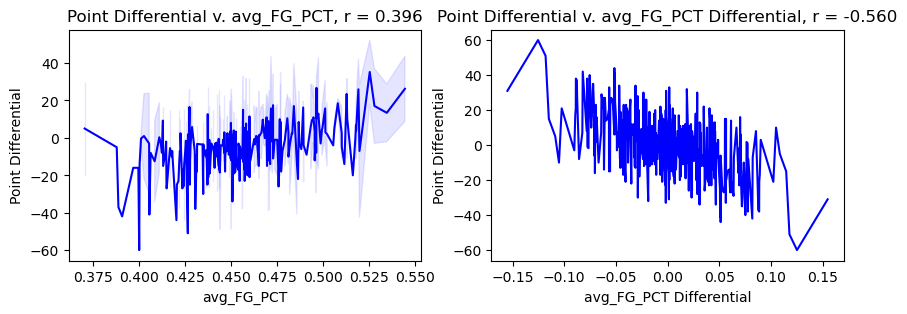

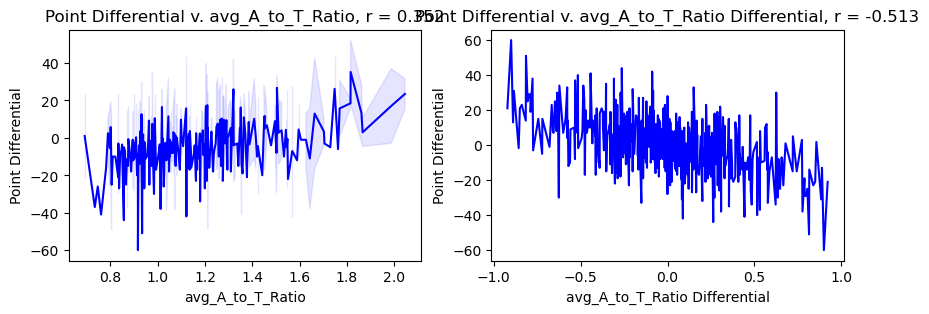

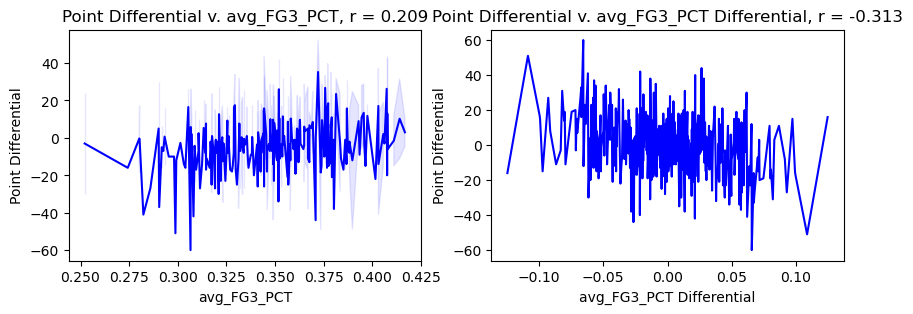

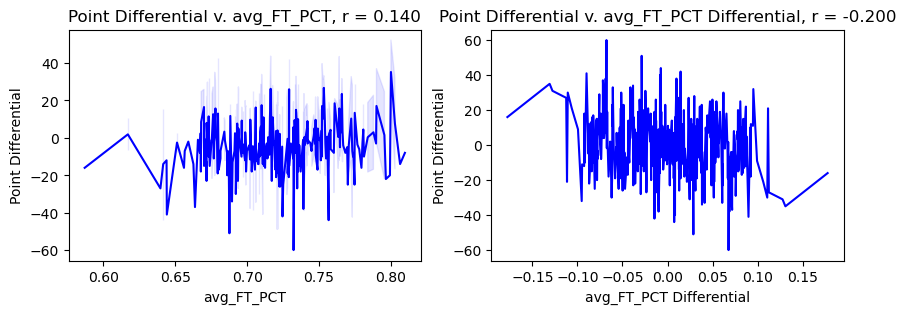

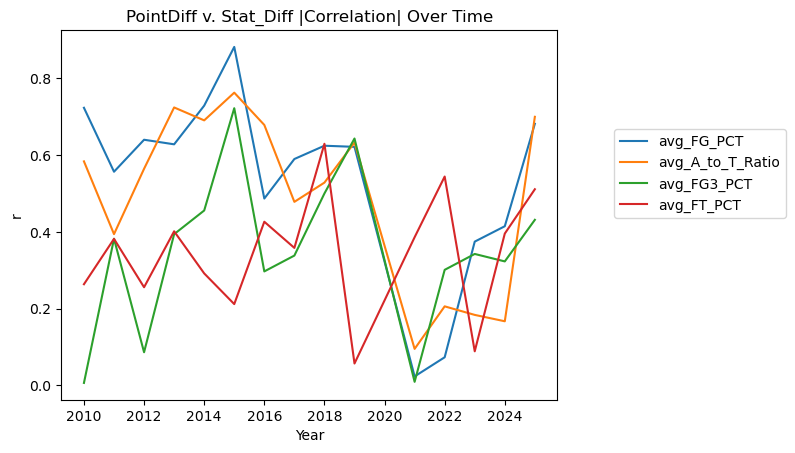

In [22]:
# try some derived metrics
W_sweet_onwards_data['T1_avg_FG_PCT'] = W_sweet_onwards_data['T1_avg_FGM'] / W_sweet_onwards_data['T1_avg_FGA']
W_sweet_onwards_data['T2_avg_FG_PCT'] = W_sweet_onwards_data['T2_avg_FGM'] / W_sweet_onwards_data['T2_avg_FGA']

W_sweet_onwards_data['T1_avg_FG3_PCT'] = W_sweet_onwards_data['T1_avg_FGM3'] / W_sweet_onwards_data['T1_avg_FGA3']
W_sweet_onwards_data['T2_avg_FG3_PCT'] = W_sweet_onwards_data['T2_avg_FGM3'] / W_sweet_onwards_data['T2_avg_FGA3']

W_sweet_onwards_data['T1_avg_FT_PCT'] = W_sweet_onwards_data['T1_avg_FTM'] / W_sweet_onwards_data['T1_avg_FTA']
W_sweet_onwards_data['T2_avg_FT_PCT'] = W_sweet_onwards_data['T2_avg_FTM'] / W_sweet_onwards_data['T2_avg_FTA']

W_sweet_onwards_data['T1_avg_A_to_T_Ratio'] = W_sweet_onwards_data['T1_avg_Ast'] / W_sweet_onwards_data['T1_avg_TO']
W_sweet_onwards_data['T2_avg_A_to_T_Ratio'] = W_sweet_onwards_data['T2_avg_Ast'] / W_sweet_onwards_data['T2_avg_TO']

advanced_stat_list = ['avg_FG_PCT', 'avg_A_to_T_Ratio', 'avg_FG3_PCT', 'avg_FT_PCT']

for advanced_stat in advanced_stat_list:
    visualize_stat_correlation(advanced_stat)

visualize_stat_correlation_over_time(advanced_stat_list)

In [23]:
selected_features = ["T1_seed", 
                     "T2_seed", 
                     "seed_Diff", 
                     "T1_PageRank", "T2_PageRank",
                     "PageRank_Diff",
                     "T1_avg_Score", "T2_avg_Score",
                     "T1_avg_Blk", "T2_avg_Blk",
                     "T1_avg_PF", "T2_avg_PF",
                     "T1_avg_FGA", "T2_avg_FGA",
                     "T1_avg_opponent_FGM", "T2_avg_opponent_FGM",
                     "T1_avg_opponent_FGA", "T2_avg_opponent_FGA",
                     "T1_avg_opponent_Blk", "T2_avg_opponent_Blk",
                     "T1_avg_opponent_PF", "T2_avg_opponent_PF",
                     "T1_avg_PointDiff", "T2_avg_PointDiff"
                     ]


print(f"Number of selected features: {len(selected_features)}")

Number of selected features: 24


Mask Season: 2016 MAE: 13.339610622823239
Mask Season: 2017 MAE: 14.306259787193051
Mask Season: 2018 MAE: 10.205043405956692
Mask Season: 2019 MAE: 7.393978739778201
Mask Season: 2021 MAE: 12.015088329050277
Mask Season: 2022 MAE: 8.178754119873046
Mask Season: 2023 MAE: 11.325678036610286
Mask Season: 2024 MAE: 8.377590320507686
Mask Season: 2025 MAE: 9.03771299769481
Mask Season: 2010 MAE: 12.510598663268267
Mask Season: 2011 MAE: 14.679197520762681
Mask Season: 2012 MAE: 8.561551059727314
Mask Season: 2013 MAE: 9.188868565029567
Mask Season: 2014 MAE: 11.248502401510875
Mask Season: 2015 MAE: 7.782742851751823
Average MAE:  10.543411828102522
brier: 0.17820471550641084
2016 0.20469
2017 0.27906
2018 0.21026
2019 0.1152
2021 0.18721
2022 0.15489
2023 0.23964
2024 0.21397
2025 0.11383
2010 0.17762
2011 0.23661
2012 0.09204
2013 0.21577
2014 0.13083
2015 0.10146
average brier score:  0.17820471550641084


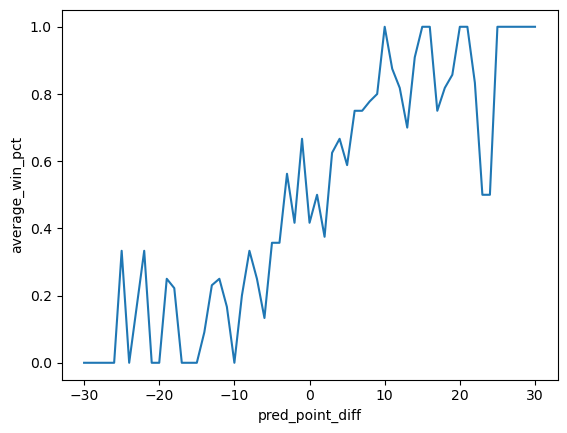

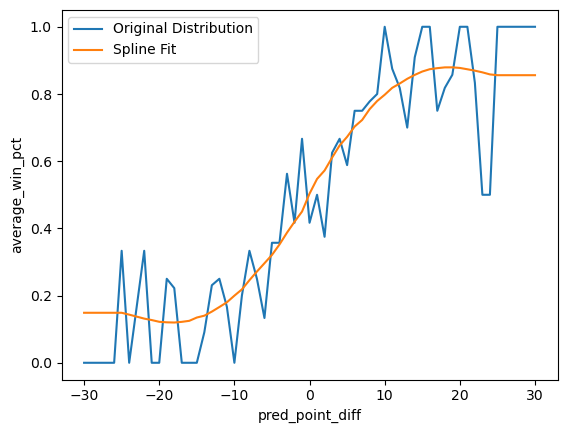

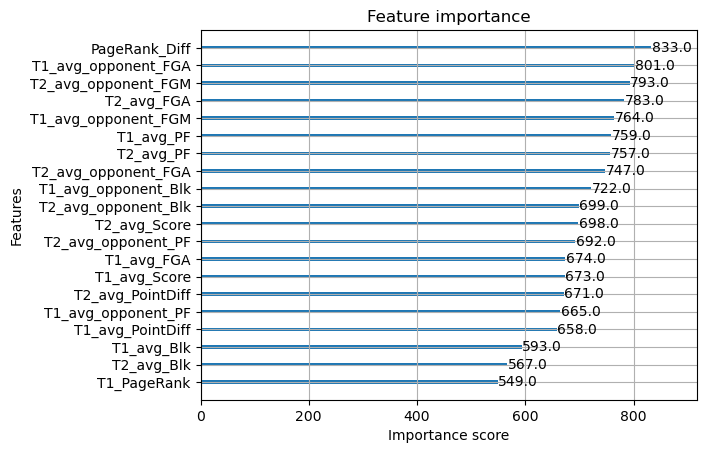

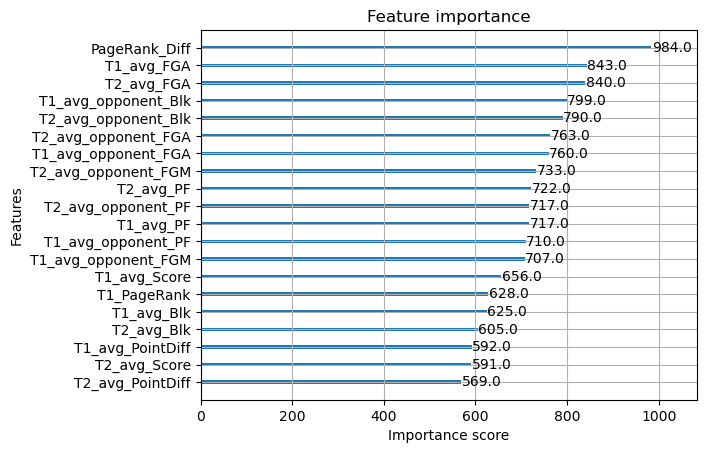

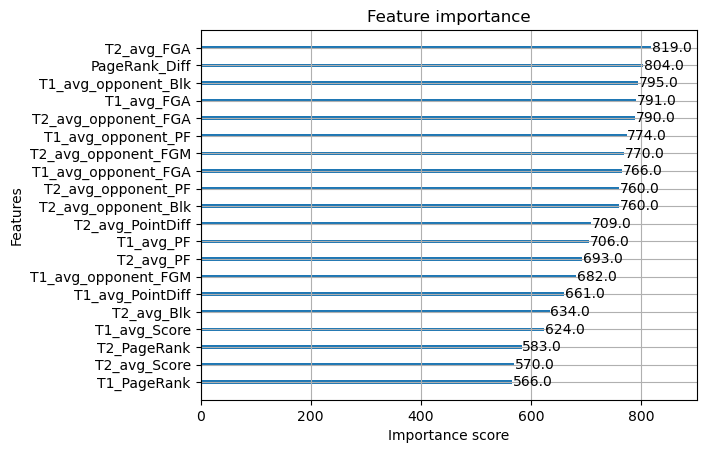

...

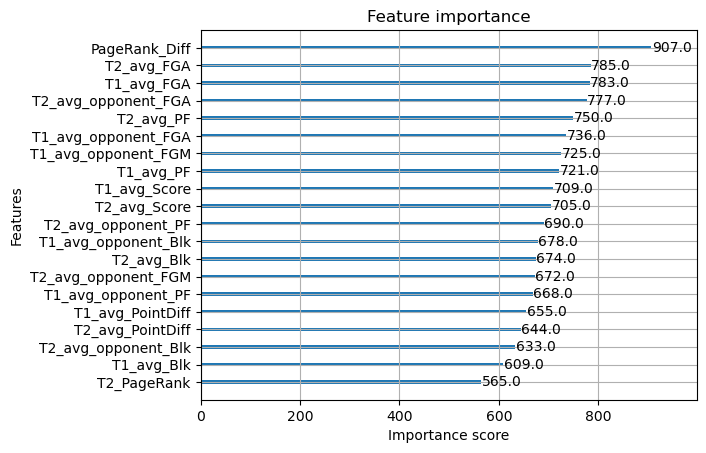

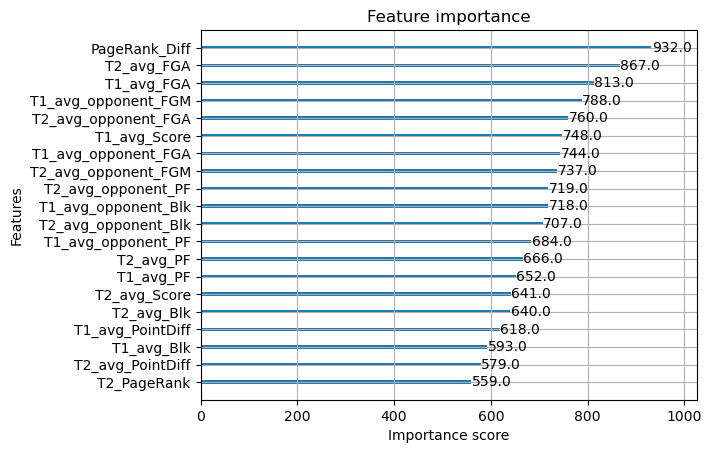

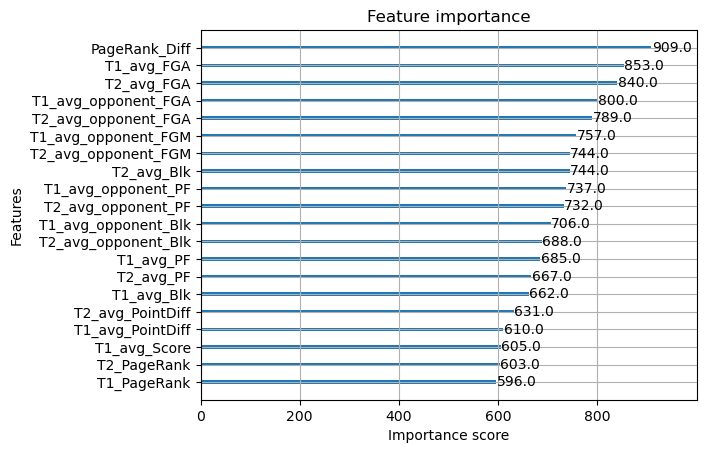

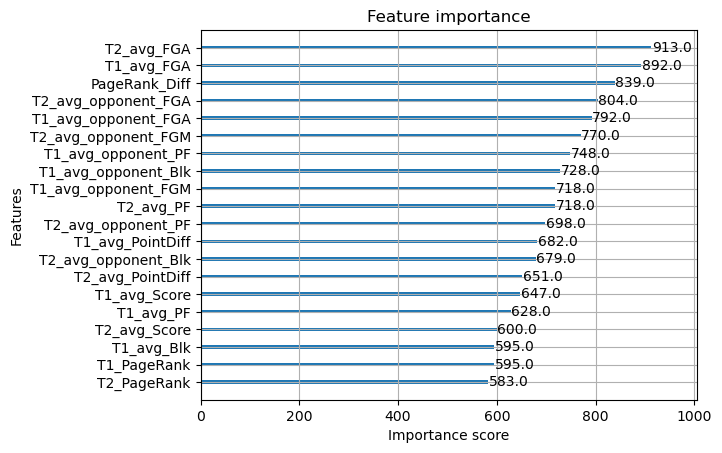

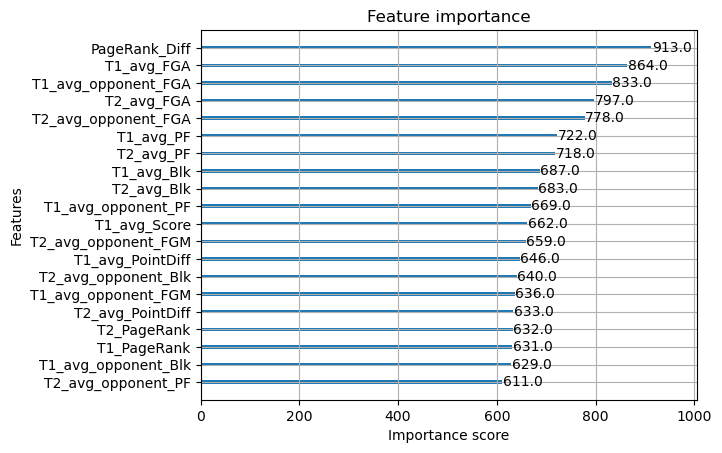

In [25]:

# Specify hyperparameters for XGBoost

param = {
    "objective": "reg:squarederror",
    "booster" : "gbtree",
    "eta" : 0.01,
    "subsample" : 0.6,
    "colsample_bynode" : 0.8,
    "num_parallel_tree" : 2,
    "min_child_weight" : 4,
    "max_depth" : 4,
    "tree_method" : "hist",
    "grow_policy" : "lossguide",
    "max_bin" : 32
}

num_rounds = 700

# Training with holdout validation - predict one year's results based on all other years

models = {}

mask_mae = []
mask_preds = []
mask_targets = []
mask_ss = []

for mask_season in set(W_sweet_onwards_data.Season):
    x_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, selected_features].values
    y_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, "PointDiff"].values

    x_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, selected_features].values
    y_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "PointDiff"].values
    season_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "Season"].values

    dtrain = xgb.DMatrix(x_train, label=y_train, feature_names=selected_features)
    dvalidation = xgb.DMatrix(x_validation, label = y_validation, feature_names=selected_features)

    models[mask_season] = xgb.train(
        params = param,
        dtrain = dtrain,
        num_boost_round = num_rounds
    )

    preds = models[mask_season].predict(dvalidation)
    print(f"Mask Season: {mask_season} MAE: {mean_absolute_error(y_validation, preds)}")

    mask_mae.append(mean_absolute_error(y_validation, preds))
    mask_preds += list(preds)
    mask_targets += list(y_validation)
    mask_ss += list(season_validation)

print(f"Average MAE:  {np.mean(mask_mae)}")

# train on each respective year, get predicted outcome, then check against actual to see how much point diff was off

# Plot a graph of average win percentage vs. predicted point differential

df = pd.DataFrame({
    "Season" : mask_ss,
    "pred" : mask_preds,
    "label" : [(t > 0) for t in mask_targets]
})

df["pred_point_diff"] = df["pred"].astype(int)

xdf = df.clip(-30,30).groupby("pred_point_diff")["label"].mean().reset_index(name = "average_win_pct")

seaborn.lineplot(x = xdf["pred_point_diff"], y = xdf["average_win_pct"])

# Fit a Curve to the jagged data derived in the average win percentage vs pred point diff graph

t = 25
dat = list(zip(mask_preds, np.array(mask_targets) > 0))
dat = sorted(dat, key = lambda x:x[0])
pred, label = list(zip(*dat))
spline_model = UnivariateSpline(np.clip(pred, -t, t), label, k = 5)
spline_fit = np.clip(spline_model(np.clip(mask_preds, -t, t)), 0.01, 0.99)
print(f"brier: {brier_score_loss(np.array(mask_targets) > 0, spline_fit)}")
df["spline"] = spline_fit
xdf = df.clip(-30,30).groupby('pred_point_diff')[['spline', 'label']].mean().reset_index()

plt.figure()
plt.xlabel("pred_point_diff")
plt.ylabel('average_win_pct')
plt.plot(xdf['pred_point_diff'], xdf['label'])
plt.plot(xdf['pred_point_diff'], xdf['spline'])
plt.legend(['Original Distribution', 'Spline Fit'])

# For each season's tournament, compute and display the brier score

avg_brier_score = 0.0
num_seasons = 0

for mask_season in set(W_sweet_onwards_data.Season):

    x = df.loc[df["Season"] == mask_season, "spline"].values
    y = df.loc[df["Season"] == mask_season, "label"].values
    print(mask_season, np.round(brier_score_loss(y,x), 5))
    avg_brier_score += brier_score_loss(y,x)
    num_seasons += 1

avg_brier_score /= num_seasons

print("average brier score: ", avg_brier_score)

for year in years:
    xgb.plot_importance(models[year], max_num_features=20)


Mask Season: 2016 MAE: 13.939090847969055
Mask Season: 2017 MAE: 14.15629723654301
Mask Season: 2018 MAE: 9.940253325965669
Mask Season: 2019 MAE: 6.668347956736882
Mask Season: 2021 MAE: 11.731625379456414
Mask Season: 2022 MAE: 7.657102641264597
Mask Season: 2023 MAE: 10.48569560176693
Mask Season: 2024 MAE: 7.692754782736301
Mask Season: 2025 MAE: 10.171180719385545
Mask Season: 2010 MAE: 14.709386653480708
Mask Season: 2011 MAE: 14.096144721905391
Mask Season: 2012 MAE: 9.26971675996427
Mask Season: 2013 MAE: 9.953135542240407
Mask Season: 2014 MAE: 12.597712184985479
Mask Season: 2015 MAE: 8.13867180524049
Average MAE:  10.74714107730941
brier: 0.18024564457772088
2016 0.24268
2017 0.26696
2018 0.19044
2019 0.10886
2021 0.1882
2022 0.14875
2023 0.24034
2024 0.19097
2025 0.13437
2010 0.21627
2011 0.23454
2012 0.09562
2013 0.19948
2014 0.15436
2015 0.09185
average brier score:  0.18024564457772088


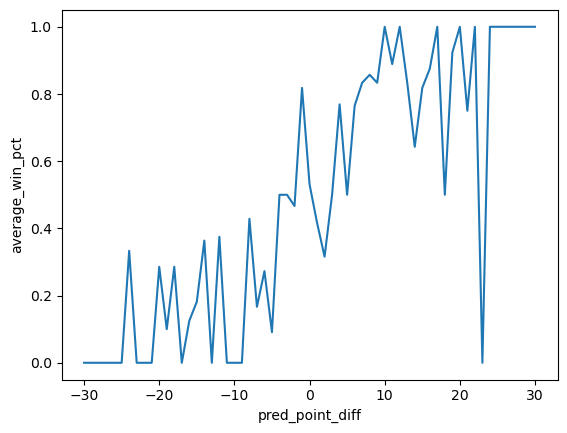

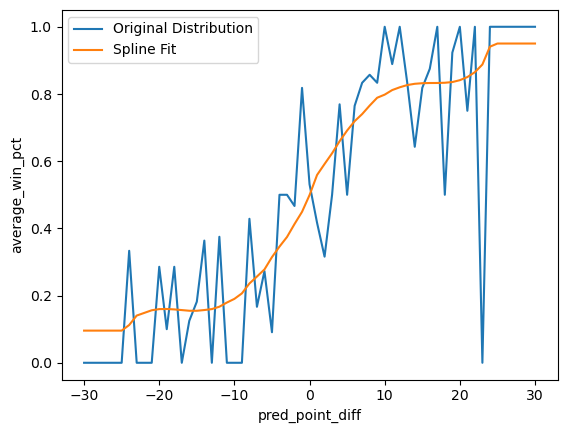

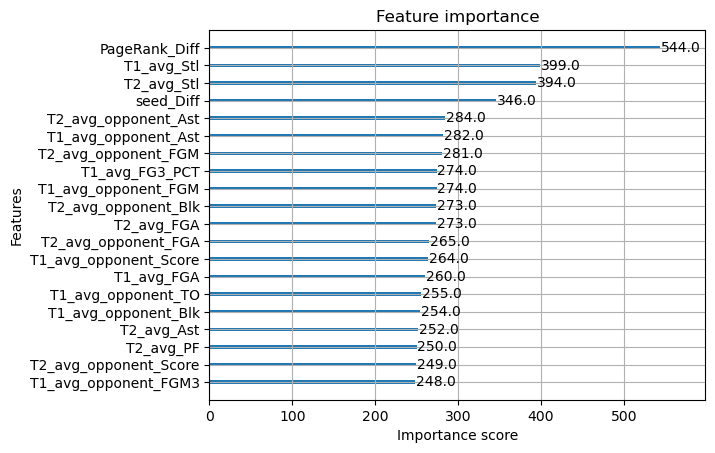

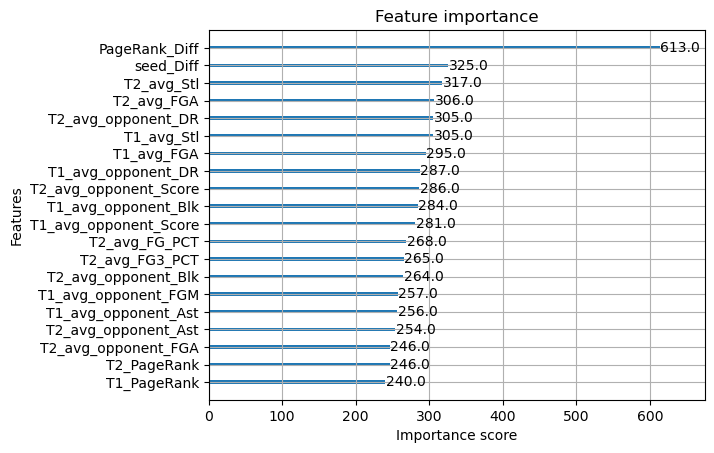

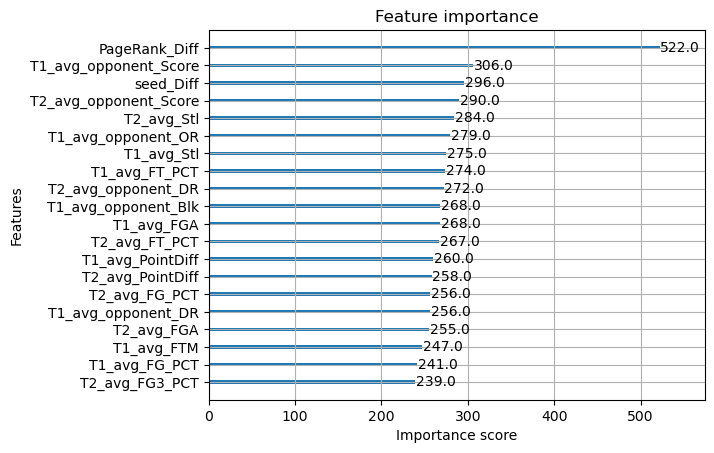

...

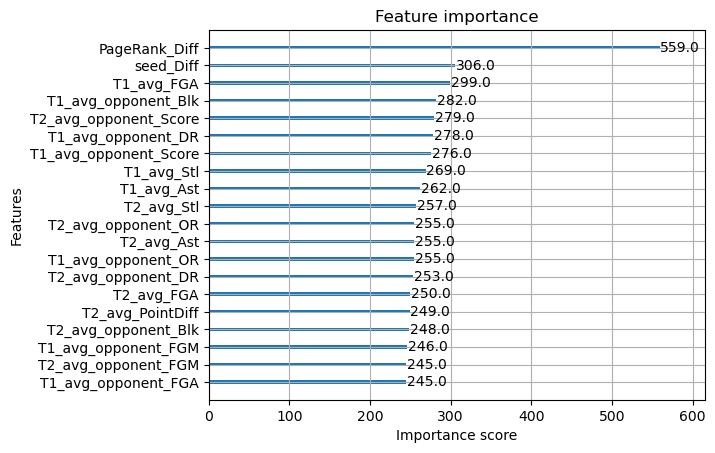

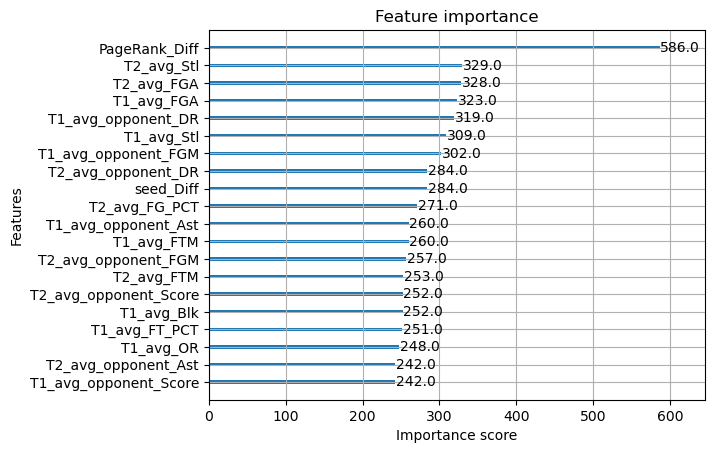

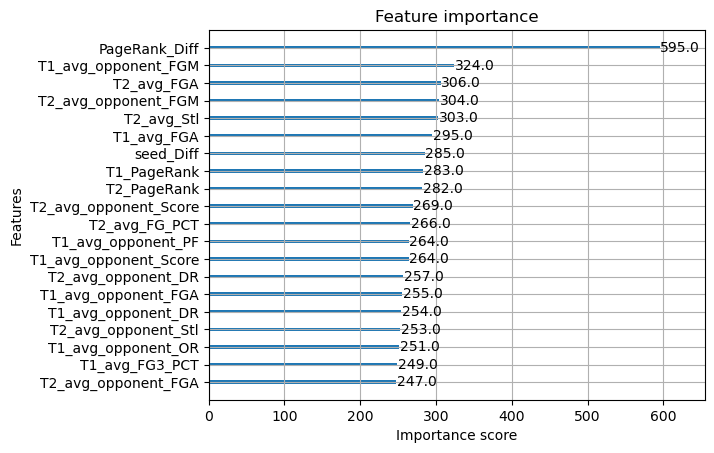

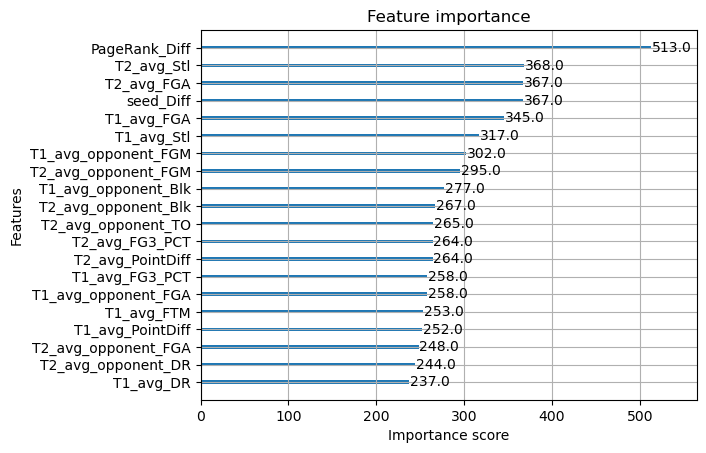

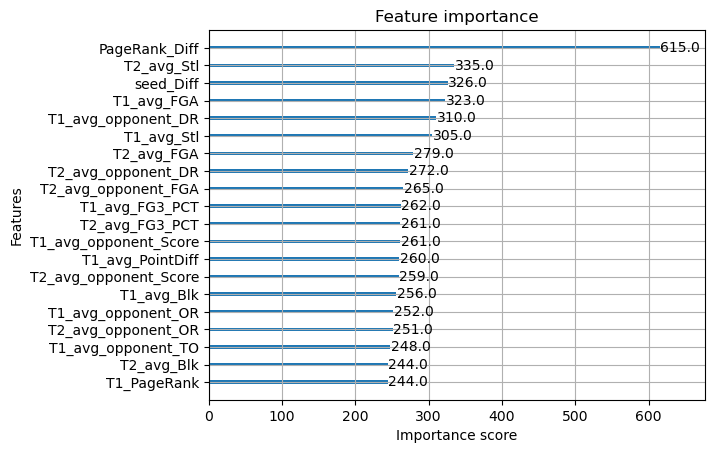

In [28]:

selected_features = W_sweet_onwards_data.columns.tolist()[5:]
# Specify hyperparameters for XGBoost

param = {
    "objective": "reg:squarederror",
    "booster" : "gbtree",
    "eta" : 0.01,
    "subsample" : 0.6,
    "colsample_bynode" : 0.8,
    "num_parallel_tree" : 2,
    "min_child_weight" : 4,
    "max_depth" : 4,
    "tree_method" : "hist",
    "grow_policy" : "lossguide",
    "max_bin" : 32
}

num_rounds = 700

# Training with holdout validation - predict one year's results based on all other years

models = {}

mask_mae = []
mask_preds = []
mask_targets = []
mask_ss = []

for mask_season in set(W_sweet_onwards_data.Season):
    x_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, selected_features].values
    y_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, "PointDiff"].values

    x_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, selected_features].values
    y_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "PointDiff"].values
    season_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "Season"].values

    dtrain = xgb.DMatrix(x_train, label=y_train, feature_names=selected_features)
    dvalidation = xgb.DMatrix(x_validation, label = y_validation, feature_names=selected_features)

    models[mask_season] = xgb.train(
        params = param,
        dtrain = dtrain,
        num_boost_round = num_rounds
    )

    preds = models[mask_season].predict(dvalidation)
    print(f"Mask Season: {mask_season} MAE: {mean_absolute_error(y_validation, preds)}")

    mask_mae.append(mean_absolute_error(y_validation, preds))
    mask_preds += list(preds)
    mask_targets += list(y_validation)
    mask_ss += list(season_validation)

print(f"Average MAE:  {np.mean(mask_mae)}")

# train on each respective year, get predicted outcome, then check against actual to see how much point diff was off

# Plot a graph of average win percentage vs. predicted point differential

df = pd.DataFrame({
    "Season" : mask_ss,
    "pred" : mask_preds,
    "label" : [(t > 0) for t in mask_targets]
})

df["pred_point_diff"] = df["pred"].astype(int)

xdf = df.clip(-30,30).groupby("pred_point_diff")["label"].mean().reset_index(name = "average_win_pct")

seaborn.lineplot(x = xdf["pred_point_diff"], y = xdf["average_win_pct"])

# Fit a Curve to the jagged data derived in the average win percentage vs pred point diff graph

t = 25
dat = list(zip(mask_preds, np.array(mask_targets) > 0))
dat = sorted(dat, key = lambda x:x[0])
pred, label = list(zip(*dat))
spline_model = UnivariateSpline(np.clip(pred, -t, t), label, k = 5)
spline_fit = np.clip(spline_model(np.clip(mask_preds, -t, t)), 0.01, 0.99)
print(f"brier: {brier_score_loss(np.array(mask_targets) > 0, spline_fit)}")
df["spline"] = spline_fit
xdf = df.clip(-30,30).groupby('pred_point_diff')[['spline', 'label']].mean().reset_index()

plt.figure()
plt.xlabel("pred_point_diff")
plt.ylabel('average_win_pct')
plt.plot(xdf['pred_point_diff'], xdf['label'])
plt.plot(xdf['pred_point_diff'], xdf['spline'])
plt.legend(['Original Distribution', 'Spline Fit'])

# For each season's tournament, compute and display the brier score

avg_brier_score = 0.0
num_seasons = 0

for mask_season in set(W_sweet_onwards_data.Season):

    x = df.loc[df["Season"] == mask_season, "spline"].values
    y = df.loc[df["Season"] == mask_season, "label"].values
    print(mask_season, np.round(brier_score_loss(y,x), 5))
    avg_brier_score += brier_score_loss(y,x)
    num_seasons += 1

avg_brier_score /= num_seasons

print("average brier score: ", avg_brier_score)

for year in years:
    xgb.plot_importance(models[year], max_num_features=20)


Mask Season: 2016 MAE: 15.009537275632223
Mask Season: 2017 MAE: 14.888561933846384
Mask Season: 2018 MAE: 11.010441552268134
Mask Season: 2019 MAE: 8.481109287341436
Mask Season: 2021 MAE: 13.527316069934104
Mask Season: 2022 MAE: 7.107450753500063
Mask Season: 2023 MAE: 10.805425568421681
Mask Season: 2024 MAE: 9.375914391626914
Mask Season: 2025 MAE: 9.498683701952299
Mask Season: 2010 MAE: 15.2273610232053
Mask Season: 2011 MAE: 12.92136863966783
Mask Season: 2012 MAE: 9.964054143870317
Mask Season: 2013 MAE: 9.439326394266551
Mask Season: 2014 MAE: 12.535417297979196
Mask Season: 2015 MAE: 8.861515256045042
Average MAE:  11.243565552637165
brier: 0.19254794702707137
2016 0.25724
2017 0.26628
2018 0.22206
2019 0.13947
2021 0.20578
2022 0.16868
2023 0.24009
2024 0.22443
2025 0.14941
2010 0.2443
2011 0.20193
2012 0.11415
2013 0.18339
2014 0.13577
2015 0.13524
average brier score:  0.1925479470270714


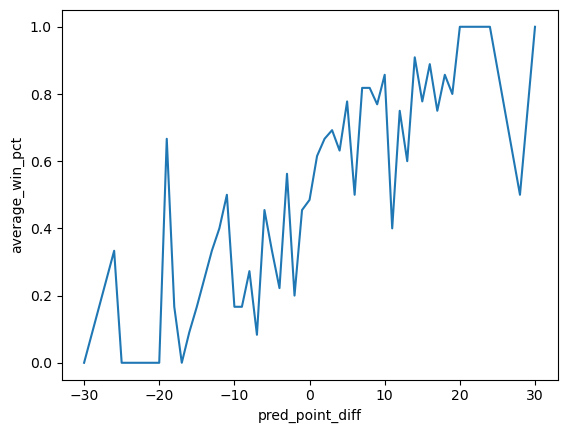

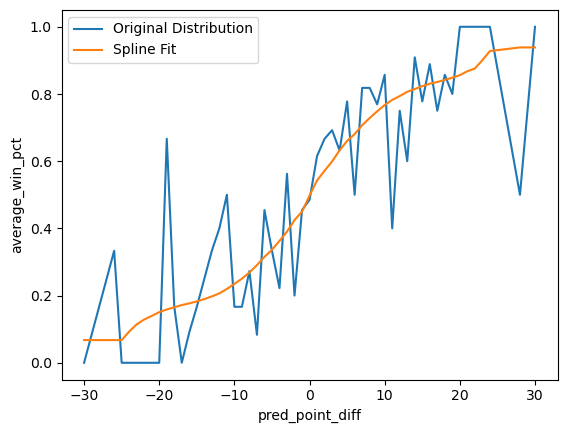

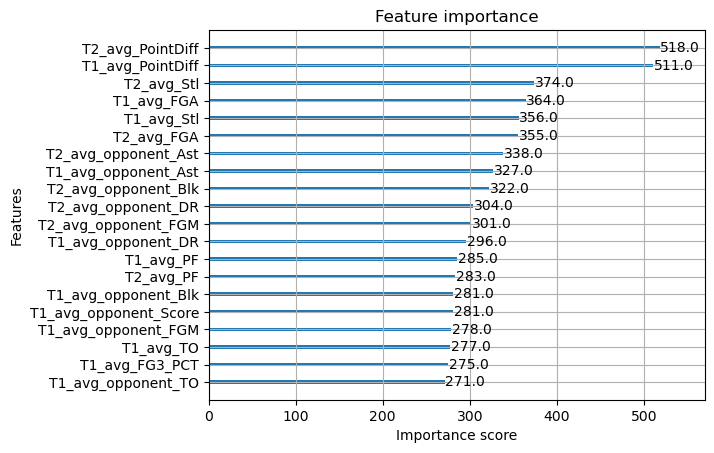

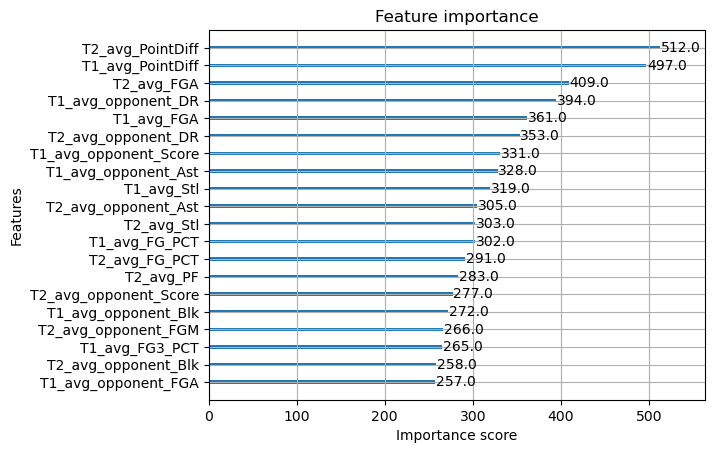

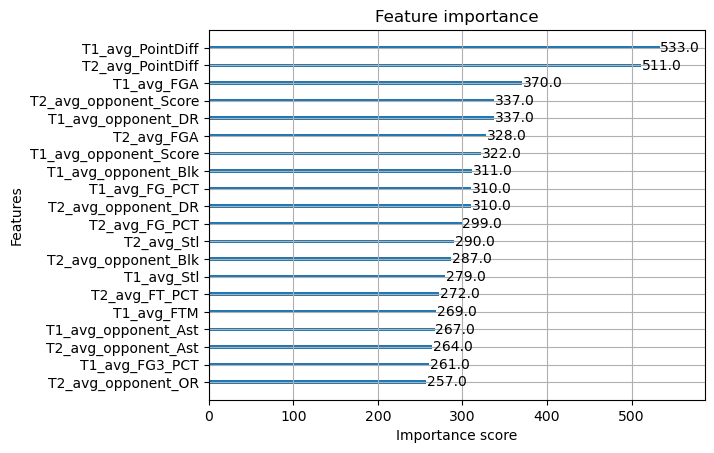

...

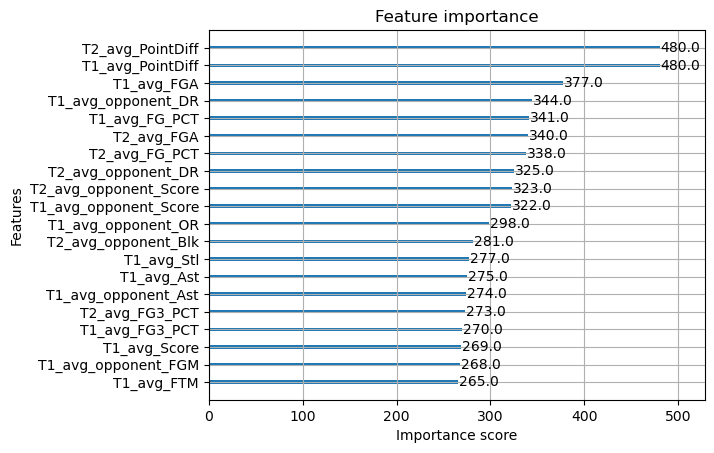

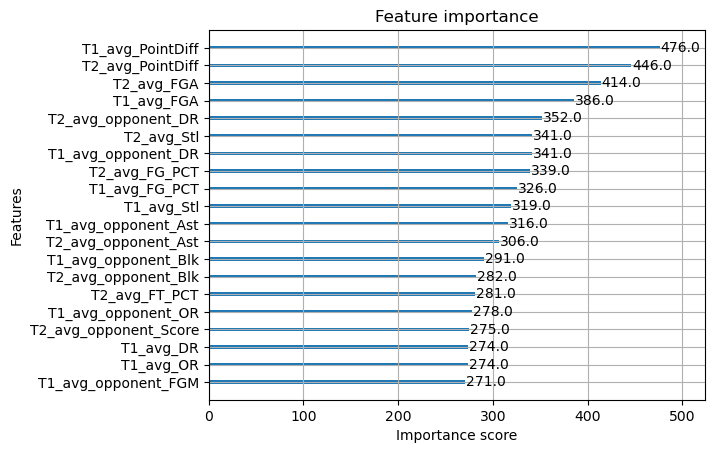

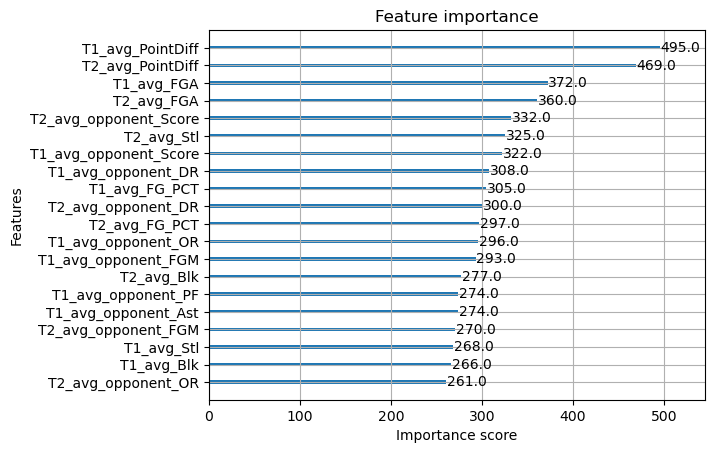

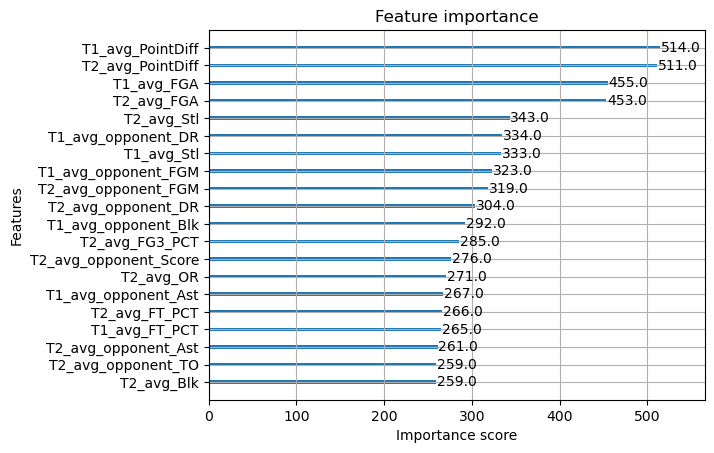

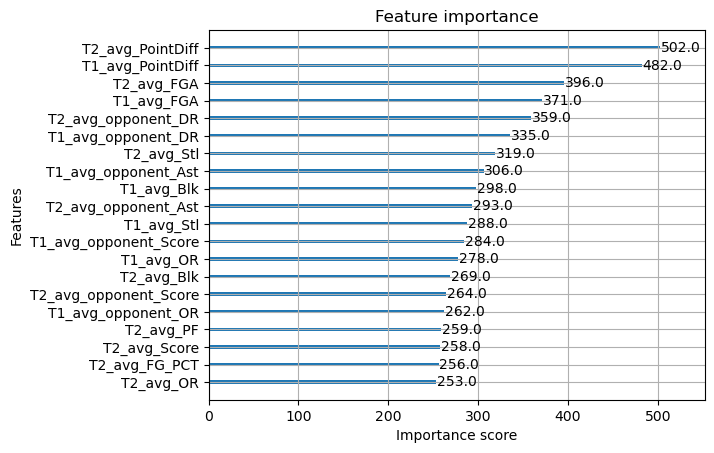

In [32]:
selected_features = W_sweet_onwards_data.columns.tolist()[11:]
# Specify hyperparameters for XGBoost

param = {
    "objective": "reg:squarederror",
    "booster" : "gbtree",
    "eta" : 0.01,
    "subsample" : 0.6,
    "colsample_bynode" : 0.8,
    "num_parallel_tree" : 2,
    "min_child_weight" : 4,
    "max_depth" : 4,
    "tree_method" : "hist",
    "grow_policy" : "lossguide",
    "max_bin" : 32
}

num_rounds = 700

# Training with holdout validation - predict one year's results based on all other years

models = {}

mask_mae = []
mask_preds = []
mask_targets = []
mask_ss = []

for mask_season in set(W_sweet_onwards_data.Season):
    x_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, selected_features].values
    y_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, "PointDiff"].values

    x_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, selected_features].values
    y_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "PointDiff"].values
    season_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "Season"].values

    dtrain = xgb.DMatrix(x_train, label=y_train, feature_names=selected_features)
    dvalidation = xgb.DMatrix(x_validation, label = y_validation, feature_names=selected_features)

    models[mask_season] = xgb.train(
        params = param,
        dtrain = dtrain,
        num_boost_round = num_rounds
    )

    preds = models[mask_season].predict(dvalidation)
    print(f"Mask Season: {mask_season} MAE: {mean_absolute_error(y_validation, preds)}")

    mask_mae.append(mean_absolute_error(y_validation, preds))
    mask_preds += list(preds)
    mask_targets += list(y_validation)
    mask_ss += list(season_validation)

print(f"Average MAE:  {np.mean(mask_mae)}")

# train on each respective year, get predicted outcome, then check against actual to see how much point diff was off

# Plot a graph of average win percentage vs. predicted point differential

df = pd.DataFrame({
    "Season" : mask_ss,
    "pred" : mask_preds,
    "label" : [(t > 0) for t in mask_targets]
})

df["pred_point_diff"] = df["pred"].astype(int)

xdf = df.clip(-30,30).groupby("pred_point_diff")["label"].mean().reset_index(name = "average_win_pct")

seaborn.lineplot(x = xdf["pred_point_diff"], y = xdf["average_win_pct"])

# Fit a Curve to the jagged data derived in the average win percentage vs pred point diff graph

t = 25
dat = list(zip(mask_preds, np.array(mask_targets) > 0))
dat = sorted(dat, key = lambda x:x[0])
pred, label = list(zip(*dat))
spline_model = UnivariateSpline(np.clip(pred, -t, t), label, k = 5)
spline_fit = np.clip(spline_model(np.clip(mask_preds, -t, t)), 0.01, 0.99)
print(f"brier: {brier_score_loss(np.array(mask_targets) > 0, spline_fit)}")
df["spline"] = spline_fit
xdf = df.clip(-30,30).groupby('pred_point_diff')[['spline', 'label']].mean().reset_index()

plt.figure()
plt.xlabel("pred_point_diff")
plt.ylabel('average_win_pct')
plt.plot(xdf['pred_point_diff'], xdf['label'])
plt.plot(xdf['pred_point_diff'], xdf['spline'])
plt.legend(['Original Distribution', 'Spline Fit'])

# For each season's tournament, compute and display the brier score

avg_brier_score = 0.0
num_seasons = 0

for mask_season in set(W_sweet_onwards_data.Season):

    x = df.loc[df["Season"] == mask_season, "spline"].values
    y = df.loc[df["Season"] == mask_season, "label"].values
    print(mask_season, np.round(brier_score_loss(y,x), 5))
    avg_brier_score += brier_score_loss(y,x)
    num_seasons += 1

avg_brier_score /= num_seasons

print("average brier score: ", avg_brier_score)

for year in years:
    xgb.plot_importance(models[year], max_num_features=20)


Mask Season: 2016 MAE: 15.009537275632223
Mask Season: 2017 MAE: 14.888561933846384
Mask Season: 2018 MAE: 11.010441552268134
Mask Season: 2019 MAE: 8.481109287341436
Mask Season: 2021 MAE: 13.527316069934104
Mask Season: 2022 MAE: 7.107450753500063
Mask Season: 2023 MAE: 10.805425568421681
Mask Season: 2024 MAE: 9.375914391626914
Mask Season: 2025 MAE: 9.498683701952299
Mask Season: 2010 MAE: 15.2273610232053
Mask Season: 2011 MAE: 12.92136863966783
Mask Season: 2012 MAE: 9.964054143870317
Mask Season: 2013 MAE: 9.439326394266551
Mask Season: 2014 MAE: 12.535417297979196
Mask Season: 2015 MAE: 8.861515256045042
Average MAE:  11.243565552637165
brier: 0.19254794702707137
2016 0.25724
2017 0.26628
2018 0.22206
2019 0.13947
2021 0.20578
2022 0.16868
2023 0.24009
2024 0.22443
2025 0.14941
2010 0.2443
2011 0.20193
2012 0.11415
2013 0.18339
2014 0.13577
2015 0.13524
average brier score:  0.1925479470270714


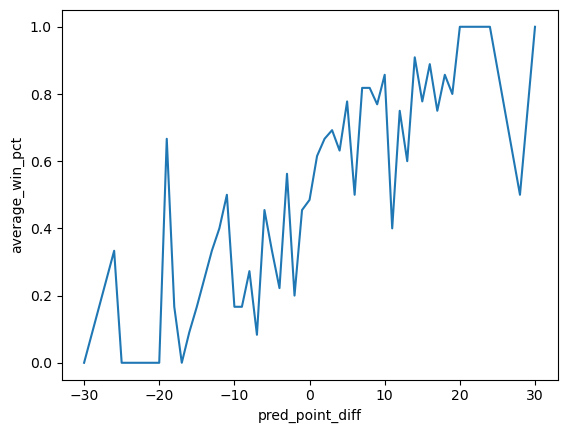

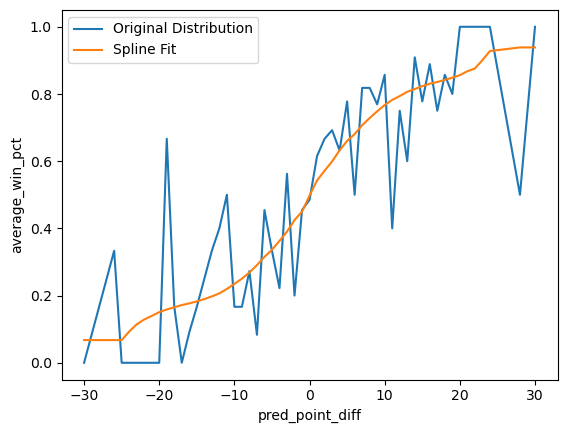

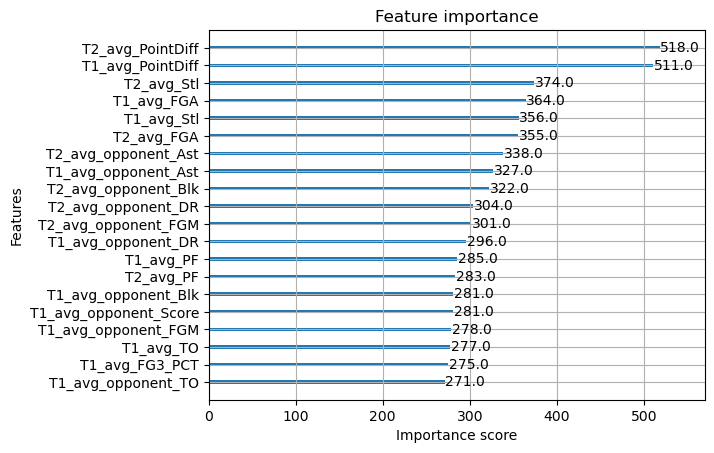

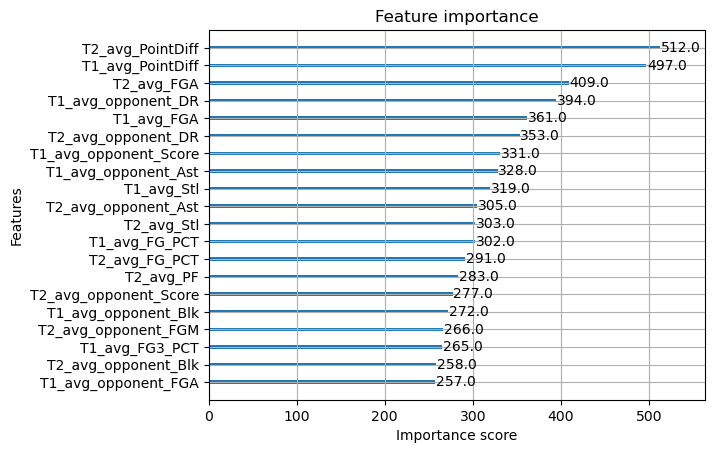

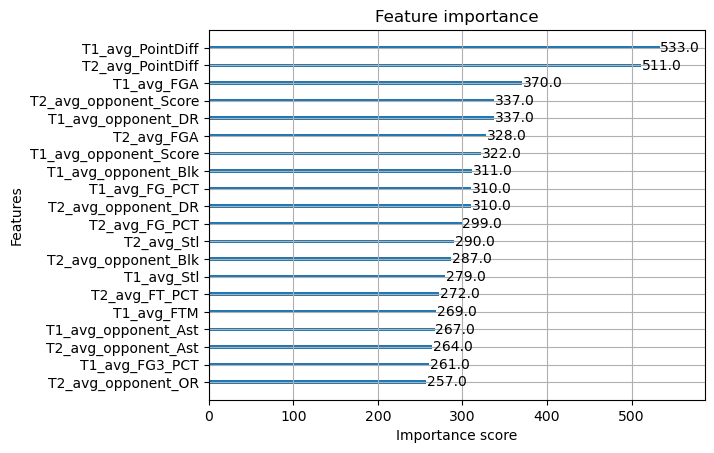

...

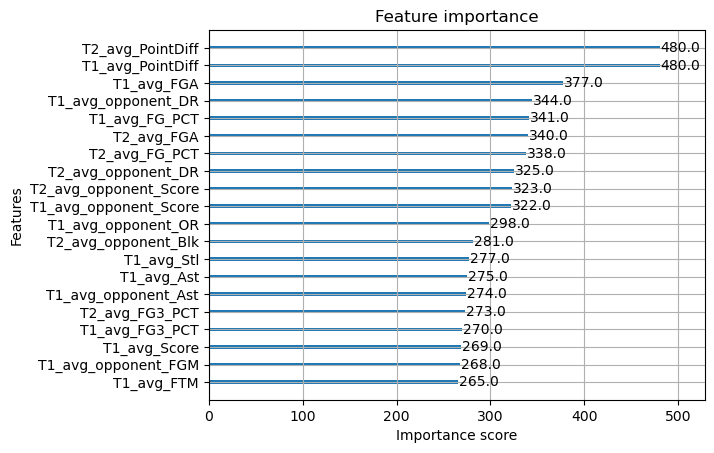

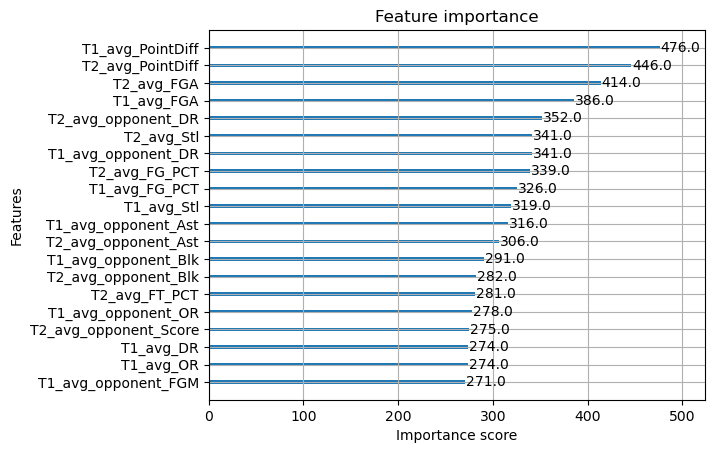

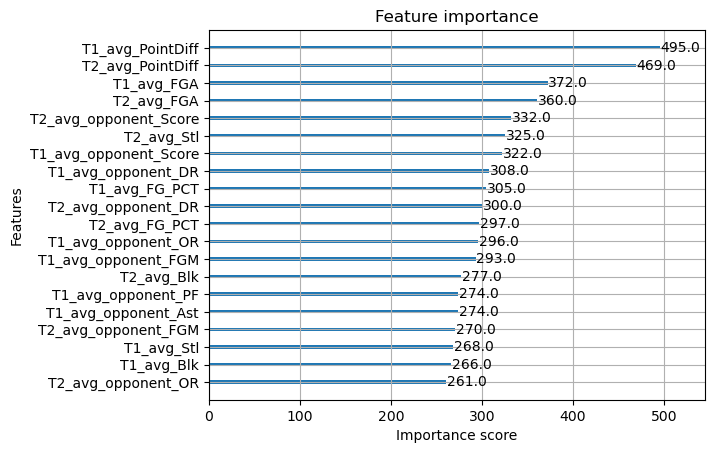

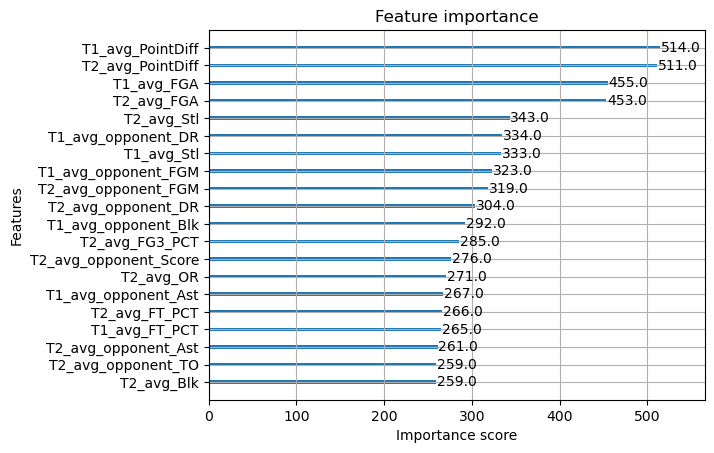

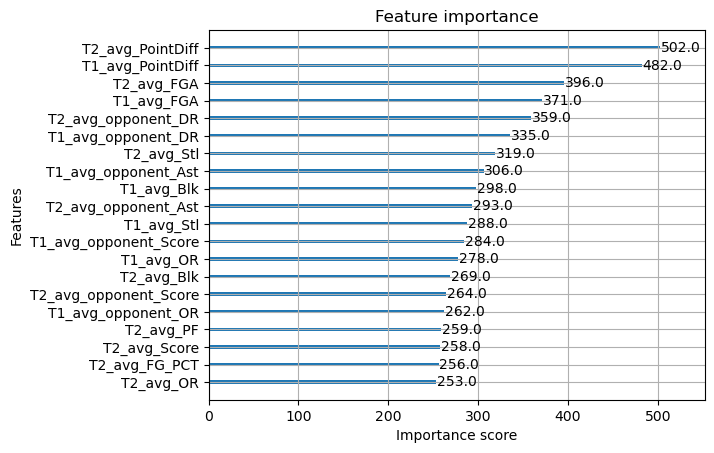

In [33]:
selected_features = ["T1_seed", 
                     "T2_seed", 
                     "seed_Diff", 
                     "T1_PageRank", "T2_PageRank",
                     "PageRank_Diff",
                     "T1_avg_Score", "T2_avg_Score",
                     "T1_avg_Blk", "T2_avg_Blk",
                     "T1_avg_PF", "T2_avg_PF",
                     "T1_avg_FGA", "T2_avg_FGA",
                     "T1_avg_opponent_FGM", "T2_avg_opponent_FGM",
                     "T1_avg_opponent_FGA", "T2_avg_opponent_FGA",
                     "T1_avg_opponent_Blk", "T2_avg_opponent_Blk",
                     "T1_avg_opponent_PF", "T2_avg_opponent_PF",
                     "T1_avg_PointDiff", "T2_avg_PointDiff",
                     "avg_FT_PCT_Diff", "avg_OR_Diff", "avg_DR_Diff", "avg_FG3_PCT_Diff"
                     ]

selected_features = W_sweet_onwards_data.columns.tolist()[11:]
# Specify hyperparameters for XGBoost

param = {
    "objective": "reg:squarederror",
    "booster" : "gbtree",
    "eta" : 0.01,
    "subsample" : 0.6,
    "colsample_bynode" : 0.8,
    "num_parallel_tree" : 2,
    "min_child_weight" : 4,
    "max_depth" : 4,
    "tree_method" : "hist",
    "grow_policy" : "lossguide",
    "max_bin" : 32
}

num_rounds = 700

# Training with holdout validation - predict one year's results based on all other years

models = {}

mask_mae = []
mask_preds = []
mask_targets = []
mask_ss = []

for mask_season in set(W_sweet_onwards_data.Season):
    x_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, selected_features].values
    y_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, "PointDiff"].values

    x_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, selected_features].values
    y_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "PointDiff"].values
    season_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "Season"].values

    dtrain = xgb.DMatrix(x_train, label=y_train, feature_names=selected_features)
    dvalidation = xgb.DMatrix(x_validation, label = y_validation, feature_names=selected_features)

    models[mask_season] = xgb.train(
        params = param,
        dtrain = dtrain,
        num_boost_round = num_rounds
    )

    preds = models[mask_season].predict(dvalidation)
    print(f"Mask Season: {mask_season} MAE: {mean_absolute_error(y_validation, preds)}")

    mask_mae.append(mean_absolute_error(y_validation, preds))
    mask_preds += list(preds)
    mask_targets += list(y_validation)
    mask_ss += list(season_validation)

print(f"Average MAE:  {np.mean(mask_mae)}")

# train on each respective year, get predicted outcome, then check against actual to see how much point diff was off

# Plot a graph of average win percentage vs. predicted point differential

df = pd.DataFrame({
    "Season" : mask_ss,
    "pred" : mask_preds,
    "label" : [(t > 0) for t in mask_targets]
})

df["pred_point_diff"] = df["pred"].astype(int)

xdf = df.clip(-30,30).groupby("pred_point_diff")["label"].mean().reset_index(name = "average_win_pct")

seaborn.lineplot(x = xdf["pred_point_diff"], y = xdf["average_win_pct"])

# Fit a Curve to the jagged data derived in the average win percentage vs pred point diff graph

t = 25
dat = list(zip(mask_preds, np.array(mask_targets) > 0))
dat = sorted(dat, key = lambda x:x[0])
pred, label = list(zip(*dat))
spline_model = UnivariateSpline(np.clip(pred, -t, t), label, k = 5)
spline_fit = np.clip(spline_model(np.clip(mask_preds, -t, t)), 0.01, 0.99)
print(f"brier: {brier_score_loss(np.array(mask_targets) > 0, spline_fit)}")
df["spline"] = spline_fit
xdf = df.clip(-30,30).groupby('pred_point_diff')[['spline', 'label']].mean().reset_index()

plt.figure()
plt.xlabel("pred_point_diff")
plt.ylabel('average_win_pct')
plt.plot(xdf['pred_point_diff'], xdf['label'])
plt.plot(xdf['pred_point_diff'], xdf['spline'])
plt.legend(['Original Distribution', 'Spline Fit'])

# For each season's tournament, compute and display the brier score

avg_brier_score = 0.0
num_seasons = 0

for mask_season in set(W_sweet_onwards_data.Season):

    x = df.loc[df["Season"] == mask_season, "spline"].values
    y = df.loc[df["Season"] == mask_season, "label"].values
    print(mask_season, np.round(brier_score_loss(y,x), 5))
    avg_brier_score += brier_score_loss(y,x)
    num_seasons += 1

avg_brier_score /= num_seasons

print("average brier score: ", avg_brier_score)

for year in years:
    xgb.plot_importance(models[year], max_num_features=20)


Mask Season: 2016 MAE: 13.939090847969055
Mask Season: 2017 MAE: 14.15629723654301
Mask Season: 2018 MAE: 9.940253325965669
Mask Season: 2019 MAE: 6.668347956736882
Mask Season: 2021 MAE: 11.731625379456414
Mask Season: 2022 MAE: 7.657102641264597
Mask Season: 2023 MAE: 10.48569560176693
Mask Season: 2024 MAE: 7.692754782736301
Mask Season: 2025 MAE: 10.171180719385545
Mask Season: 2010 MAE: 14.709386653480708
Mask Season: 2011 MAE: 14.096144721905391
Mask Season: 2012 MAE: 9.26971675996427
Mask Season: 2013 MAE: 9.953135542240407
Mask Season: 2014 MAE: 12.597712184985479
Mask Season: 2015 MAE: 8.13867180524049
Average MAE:  10.74714107730941
brier: 0.18024564457772088
2016 0.24268
2017 0.26696
2018 0.19044
2019 0.10886
2021 0.1882
2022 0.14875
2023 0.24034
2024 0.19097
2025 0.13437
2010 0.21627
2011 0.23454
2012 0.09562
2013 0.19948
2014 0.15436
2015 0.09185
average brier score:  0.18024564457772088


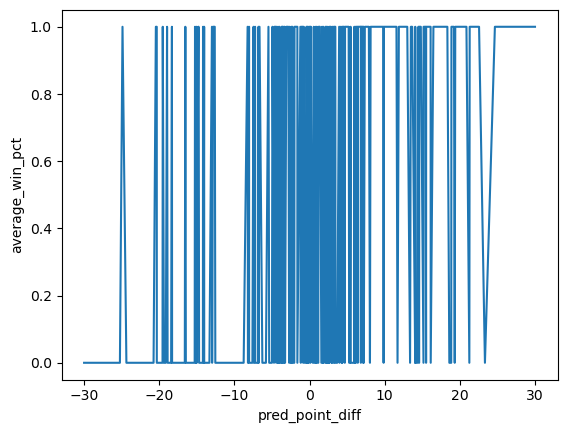

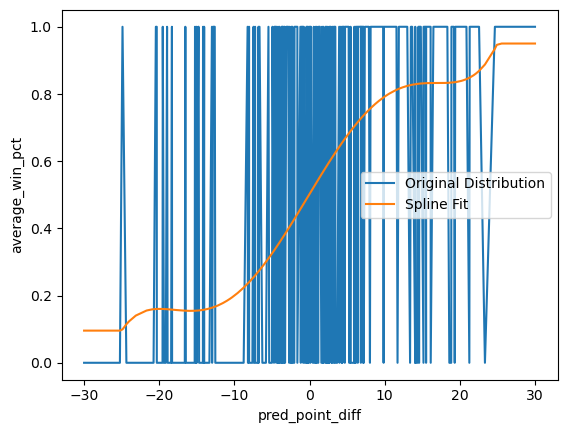

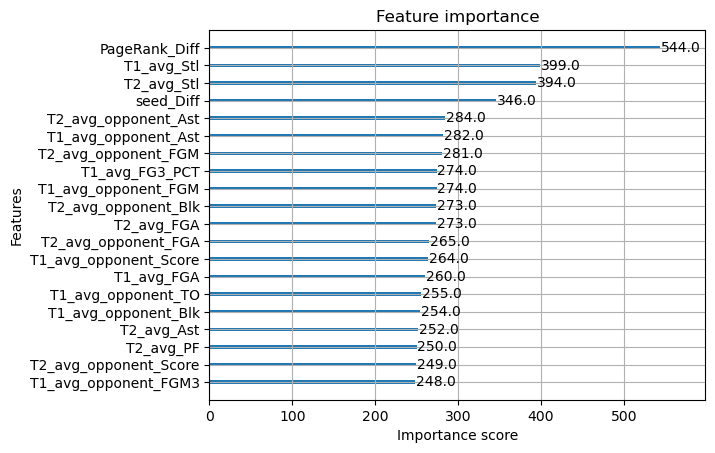

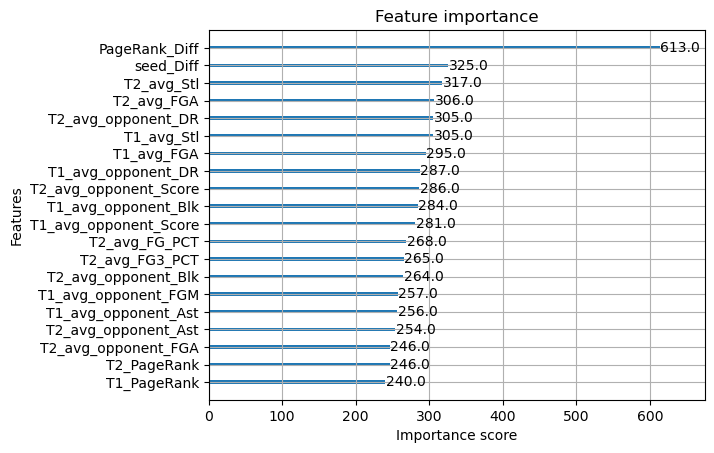

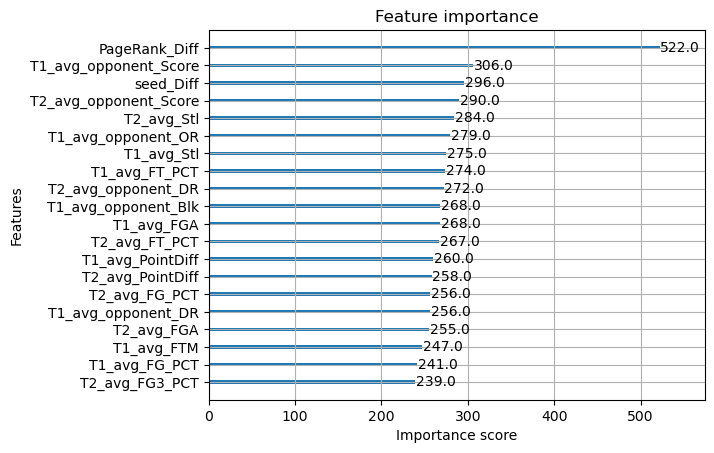

...

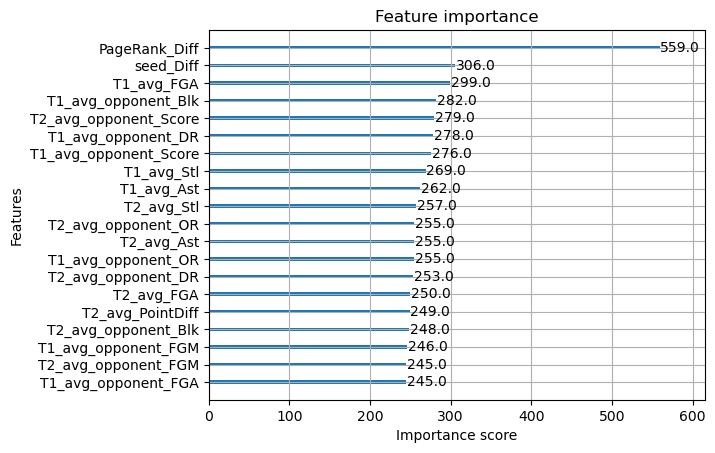

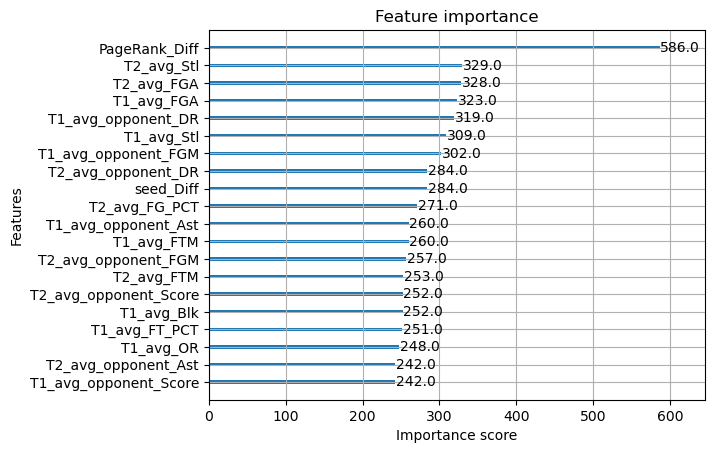

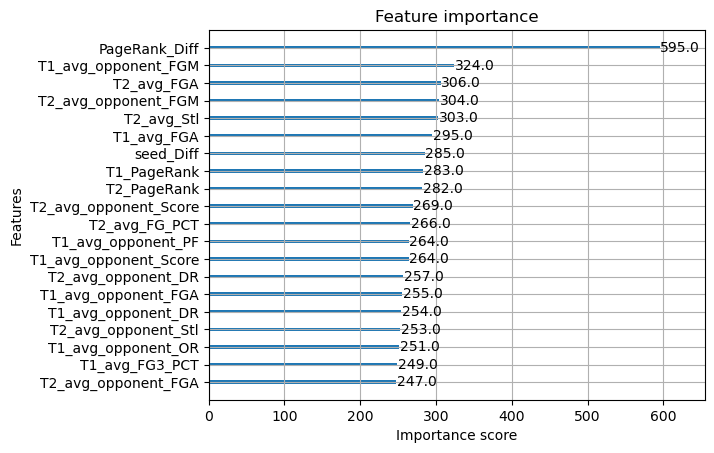

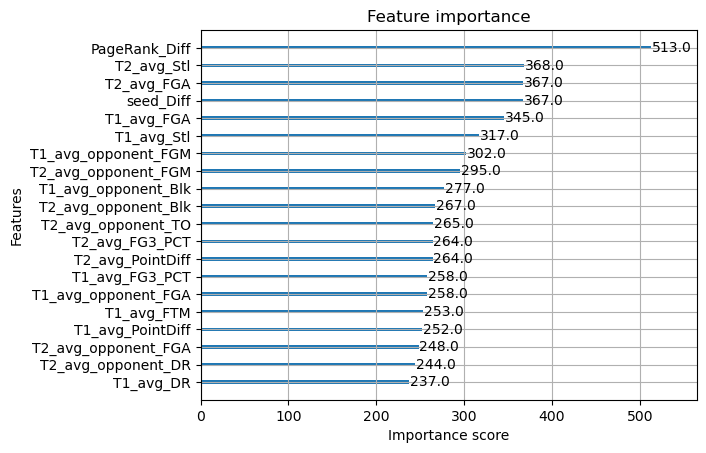

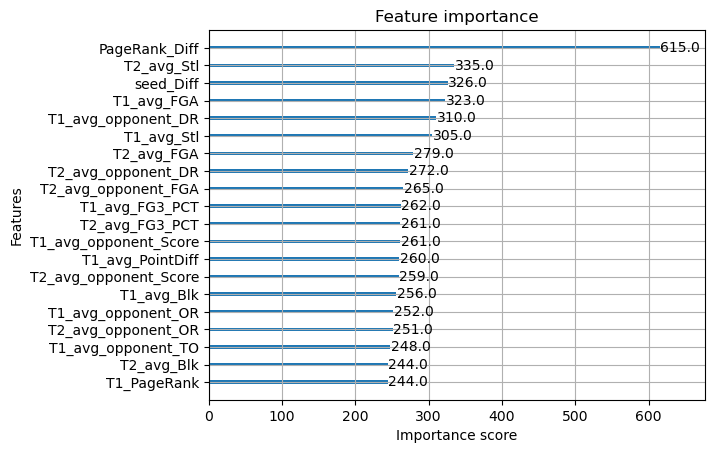

In [34]:

selected_features = W_sweet_onwards_data.columns.tolist()[5:]
# Specify hyperparameters for XGBoost

param = {
    "objective": "reg:squarederror",
    "booster" : "gbtree",
    "eta" : 0.01,
    "subsample" : 0.6,
    "colsample_bynode" : 0.8,
    "num_parallel_tree" : 2,
    "min_child_weight" : 4,
    "max_depth" : 4,
    "tree_method" : "hist",
    "grow_policy" : "lossguide",
    "max_bin" : 32
}

num_rounds = 700

# Training with holdout validation - predict one year's results based on all other years

models = {}

mask_mae = []
mask_preds = []
mask_targets = []
mask_ss = []

for mask_season in set(W_sweet_onwards_data.Season):
    x_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, selected_features].values
    y_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, "PointDiff"].values

    x_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, selected_features].values
    y_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "PointDiff"].values
    season_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "Season"].values

    dtrain = xgb.DMatrix(x_train, label=y_train, feature_names=selected_features)
    dvalidation = xgb.DMatrix(x_validation, label = y_validation, feature_names=selected_features)

    models[mask_season] = xgb.train(
        params = param,
        dtrain = dtrain,
        num_boost_round = num_rounds
    )

    preds = models[mask_season].predict(dvalidation)
    print(f"Mask Season: {mask_season} MAE: {mean_absolute_error(y_validation, preds)}")

    mask_mae.append(mean_absolute_error(y_validation, preds))
    mask_preds += list(preds)
    mask_targets += list(y_validation)
    mask_ss += list(season_validation)

print(f"Average MAE:  {np.mean(mask_mae)}")

# train on each respective year, get predicted outcome, then check against actual to see how much point diff was off

# Plot a graph of average win percentage vs. predicted point differential

df = pd.DataFrame({
    "Season" : mask_ss,
    "pred" : mask_preds,
    "label" : [(t > 0) for t in mask_targets]
})

df["pred_point_diff"] = df["pred"]

xdf = df.clip(-30,30).groupby("pred_point_diff")["label"].mean().reset_index(name = "average_win_pct")

seaborn.lineplot(x = xdf["pred_point_diff"], y = xdf["average_win_pct"])

# Fit a Curve to the jagged data derived in the average win percentage vs pred point diff graph

t = 25
dat = list(zip(mask_preds, np.array(mask_targets) > 0))
dat = sorted(dat, key = lambda x:x[0])
pred, label = list(zip(*dat))
spline_model = UnivariateSpline(np.clip(pred, -t, t), label, k = 5)
spline_fit = np.clip(spline_model(np.clip(mask_preds, -t, t)), 0.01, 0.99)
print(f"brier: {brier_score_loss(np.array(mask_targets) > 0, spline_fit)}")
df["spline"] = spline_fit
xdf = df.clip(-30,30).groupby('pred_point_diff')[['spline', 'label']].mean().reset_index()

plt.figure()
plt.xlabel("pred_point_diff")
plt.ylabel('average_win_pct')
plt.plot(xdf['pred_point_diff'], xdf['label'])
plt.plot(xdf['pred_point_diff'], xdf['spline'])
plt.legend(['Original Distribution', 'Spline Fit'])

# For each season's tournament, compute and display the brier score

avg_brier_score = 0.0
num_seasons = 0

for mask_season in set(W_sweet_onwards_data.Season):

    x = df.loc[df["Season"] == mask_season, "spline"].values
    y = df.loc[df["Season"] == mask_season, "label"].values
    print(mask_season, np.round(brier_score_loss(y,x), 5))
    avg_brier_score += brier_score_loss(y,x)
    num_seasons += 1

avg_brier_score /= num_seasons

print("average brier score: ", avg_brier_score)

for year in years:
    xgb.plot_importance(models[year], max_num_features=20)


In [40]:
for c in W_sweet_onwards_data.columns:
    statistic = c.split('_')
    # 1 - 2
    if len(statistic) >= 2 and statistic[1] == 'avg':
        stat_name = c[3:]
        print(stat_name)
        W_sweet_onwards_data[f"{stat_name}_Diff"] = W_sweet_onwards_data[f"T1_{stat_name}"] - W_sweet_onwards_data[f"T2_{stat_name}"]
    

avg_Score
avg_FGM
avg_FGA
avg_FGM3
avg_FGA3
avg_FTM
avg_FTA
avg_OR
avg_DR
avg_Ast
avg_TO
avg_Stl
avg_Blk
avg_PF
avg_opponent_Score
avg_opponent_FGM
avg_opponent_FGA
avg_opponent_FGM3
avg_opponent_FGA3
avg_opponent_FTM
avg_opponent_FTA
avg_opponent_OR
avg_opponent_DR
avg_opponent_Ast
avg_opponent_TO
avg_opponent_Stl
avg_opponent_Blk
avg_opponent_PF
avg_PointDiff
avg_Score
avg_FGM
avg_FGA
avg_FGM3
avg_FGA3
avg_FTM
avg_FTA
avg_OR
avg_DR
avg_Ast
avg_TO
avg_Stl
avg_Blk
avg_PF
avg_opponent_Score
avg_opponent_FGM
avg_opponent_FGA
avg_opponent_FGM3
avg_opponent_FGA3
avg_opponent_FTM
avg_opponent_FTA
avg_opponent_OR
avg_opponent_DR
avg_opponent_Ast
avg_opponent_TO
avg_opponent_Stl
avg_opponent_Blk
avg_opponent_PF
avg_PointDiff
avg_FG_PCT
avg_FG_PCT
avg_FG3_PCT
avg_FG3_PCT
avg_FT_PCT
avg_FT_PCT
avg_A_to_T_Ratio
avg_A_to_T_Ratio


Mask Season: 2016 MAE: 13.941084095835686
Mask Season: 2017 MAE: 14.392457836976757
Mask Season: 2018 MAE: 10.39767617997196
Mask Season: 2019 MAE: 7.135477902491887
Mask Season: 2021 MAE: 12.614006927443876
Mask Season: 2022 MAE: 7.87386437634627
Mask Season: 2023 MAE: 10.225788367787997
Mask Season: 2024 MAE: 8.737207214037577
Mask Season: 2025 MAE: 9.662771419435739
Mask Season: 2010 MAE: 15.804564379928289
Mask Season: 2011 MAE: 13.381992654005687
Mask Season: 2012 MAE: 9.02721875950142
Mask Season: 2013 MAE: 9.224276514516935
Mask Season: 2014 MAE: 11.736296872297922
Mask Season: 2015 MAE: 8.026397794264335
Average MAE:  10.812072086322821
brier: 0.17983845289989192
2016 0.24299
2017 0.24334
2018 0.18921
2019 0.12288
2021 0.18079
2022 0.14927
2023 0.2345
2024 0.2092
2025 0.12046
2010 0.23233
2011 0.23678
2012 0.09725
2013 0.18947
2014 0.15166
2015 0.09744
average brier score:  0.1798384528998919


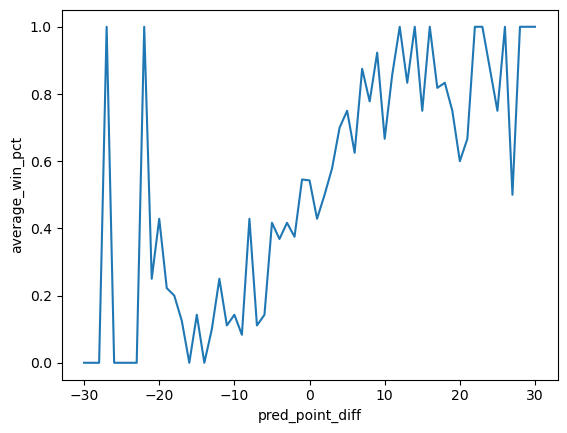

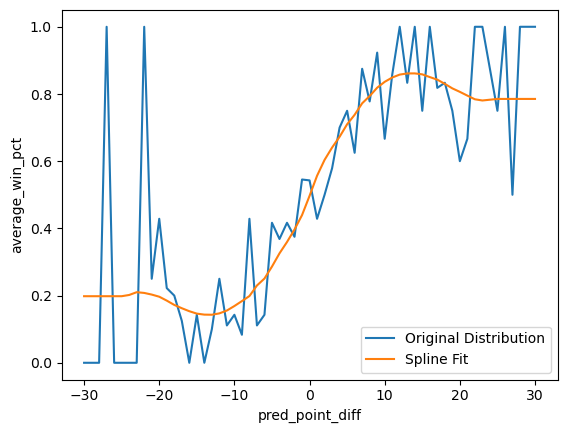

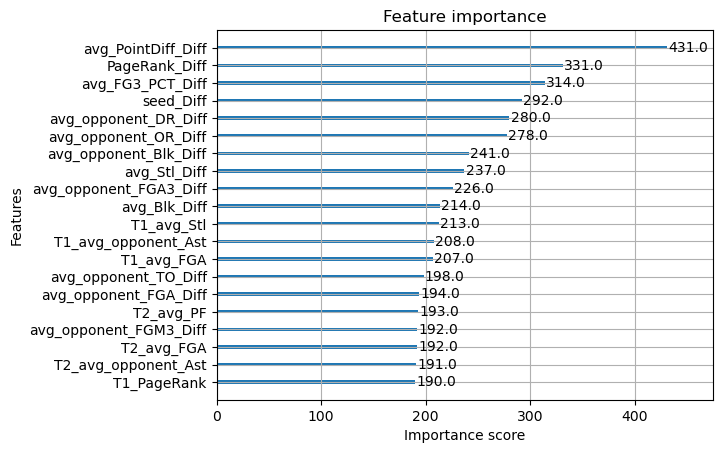

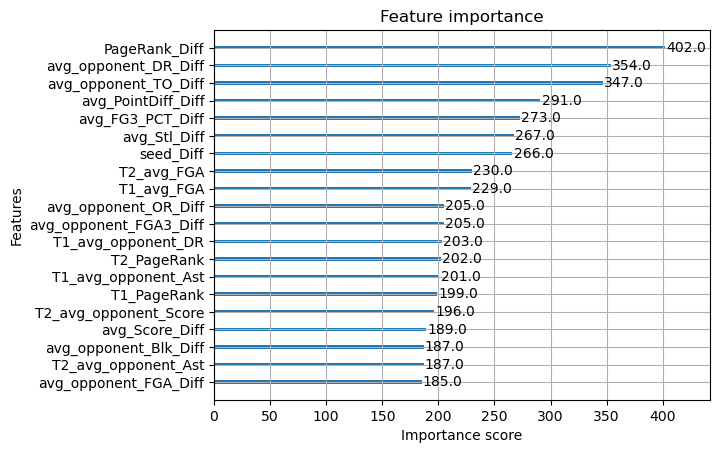

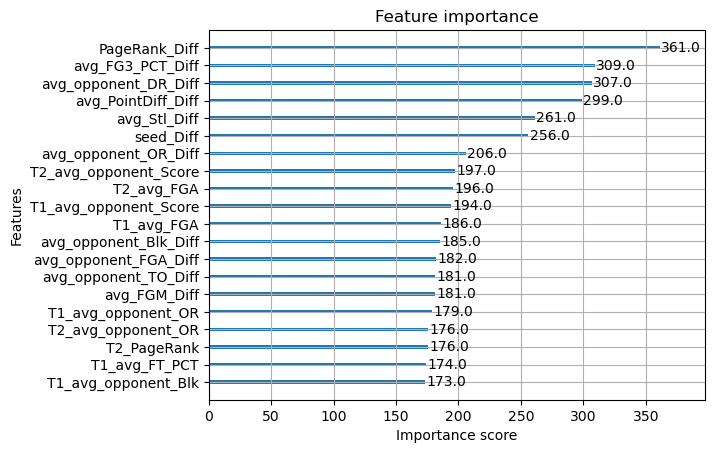

...

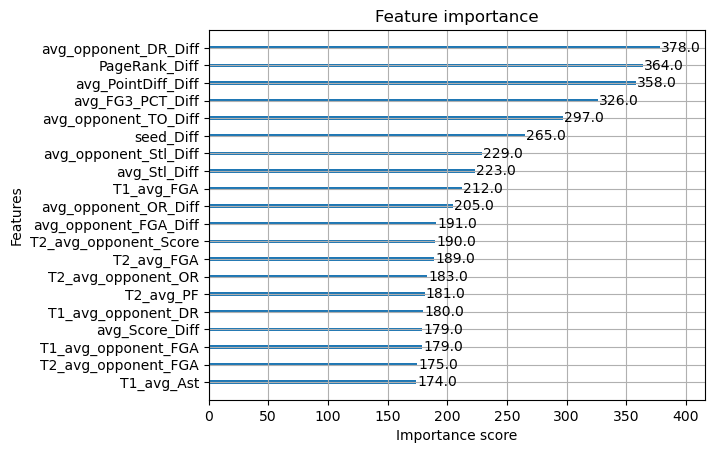

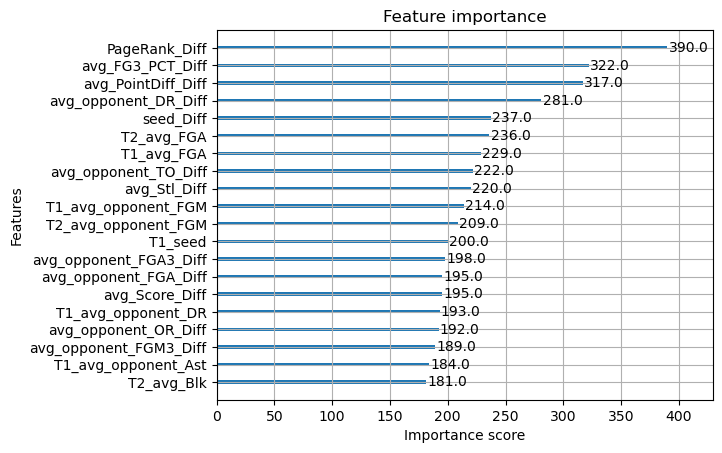

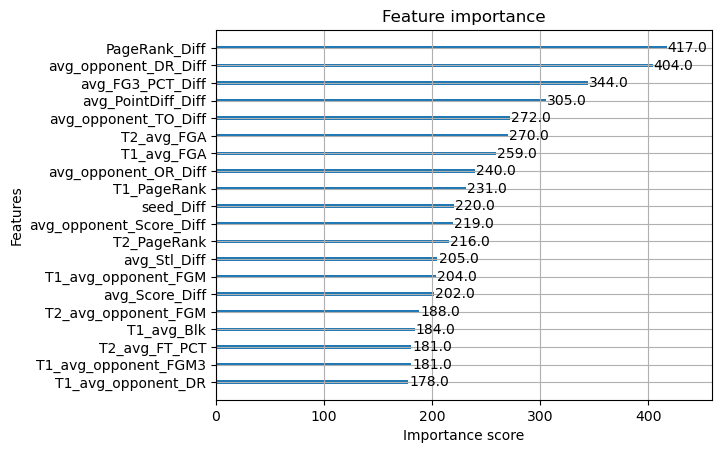

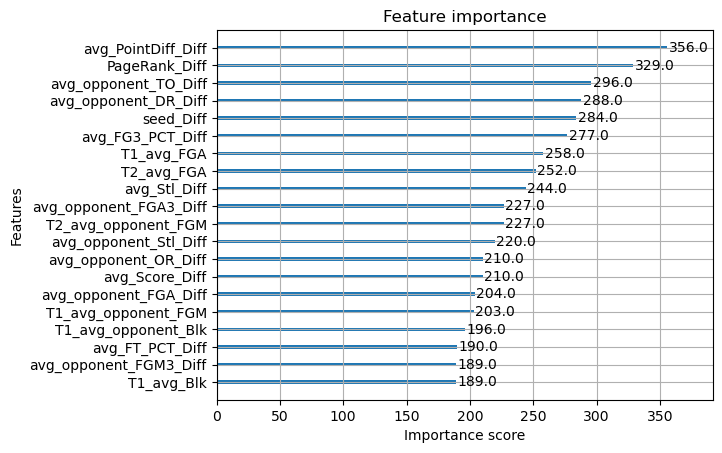

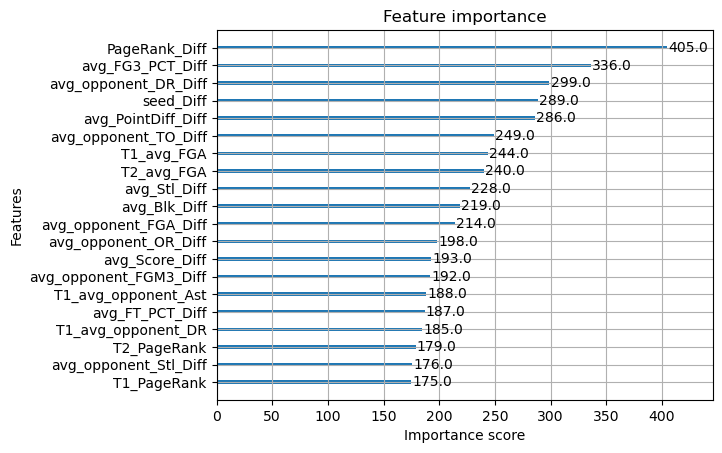

In [42]:

selected_features = W_sweet_onwards_data.columns.tolist()[5:]

param = {
    "objective": "reg:squarederror",
    "booster" : "gbtree",
    "eta" : 0.01,
    "subsample" : 0.6,
    "colsample_bynode" : 0.8,
    "num_parallel_tree" : 2,
    "min_child_weight" : 4,
    "max_depth" : 4,
    "tree_method" : "hist",
    "grow_policy" : "lossguide",
    "max_bin" : 32
}

num_rounds = 700

# Training with holdout validation - predict one year's results based on all other years

models = {}

mask_mae = []
mask_preds = []
mask_targets = []
mask_ss = []

for mask_season in set(W_sweet_onwards_data.Season):
    x_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, selected_features].values
    y_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, "PointDiff"].values

    x_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, selected_features].values
    y_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "PointDiff"].values
    season_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "Season"].values

    dtrain = xgb.DMatrix(x_train, label=y_train, feature_names=selected_features)
    dvalidation = xgb.DMatrix(x_validation, label = y_validation, feature_names=selected_features)

    models[mask_season] = xgb.train(
        params = param,
        dtrain = dtrain,
        num_boost_round = num_rounds
    )

    preds = models[mask_season].predict(dvalidation)
    print(f"Mask Season: {mask_season} MAE: {mean_absolute_error(y_validation, preds)}")

    mask_mae.append(mean_absolute_error(y_validation, preds))
    mask_preds += list(preds)
    mask_targets += list(y_validation)
    mask_ss += list(season_validation)

print(f"Average MAE:  {np.mean(mask_mae)}")

# train on each respective year, get predicted outcome, then check against actual to see how much point diff was off

# Plot a graph of average win percentage vs. predicted point differential

df = pd.DataFrame({
    "Season" : mask_ss,
    "pred" : mask_preds,
    "label" : [(t > 0) for t in mask_targets]
})

df["pred_point_diff"] = df["pred"].astype('int')

xdf = df.clip(-30,30).groupby("pred_point_diff")["label"].mean().reset_index(name = "average_win_pct")

seaborn.lineplot(x = xdf["pred_point_diff"], y = xdf["average_win_pct"])

# Fit a Curve to the jagged data derived in the average win percentage vs pred point diff graph

t = 25
dat = list(zip(mask_preds, np.array(mask_targets) > 0))
dat = sorted(dat, key = lambda x:x[0])
pred, label = list(zip(*dat))
spline_model = UnivariateSpline(np.clip(pred, -t, t), label, k = 5)
spline_fit = np.clip(spline_model(np.clip(mask_preds, -t, t)), 0.01, 0.99)
print(f"brier: {brier_score_loss(np.array(mask_targets) > 0, spline_fit)}")
df["spline"] = spline_fit
xdf = df.clip(-30,30).groupby('pred_point_diff')[['spline', 'label']].mean().reset_index()

plt.figure()
plt.xlabel("pred_point_diff")
plt.ylabel('average_win_pct')
plt.plot(xdf['pred_point_diff'], xdf['label'])
plt.plot(xdf['pred_point_diff'], xdf['spline'])
plt.legend(['Original Distribution', 'Spline Fit'])

# For each season's tournament, compute and display the brier score

avg_brier_score = 0.0
num_seasons = 0

for mask_season in set(W_sweet_onwards_data.Season):

    x = df.loc[df["Season"] == mask_season, "spline"].values
    y = df.loc[df["Season"] == mask_season, "label"].values
    print(mask_season, np.round(brier_score_loss(y,x), 5))
    avg_brier_score += brier_score_loss(y,x)
    num_seasons += 1

avg_brier_score /= num_seasons

print("average brier score: ", avg_brier_score)

for year in years:
    xgb.plot_importance(models[year], max_num_features=20)


Mask Season: 2016 MAE: 14.040356083710988
Mask Season: 2017 MAE: 13.620879760494939
Mask Season: 2018 MAE: 10.524123368329471
Mask Season: 2019 MAE: 8.308058994387586
Mask Season: 2021 MAE: 12.95234183602863
Mask Season: 2022 MAE: 7.135138740936914
Mask Season: 2023 MAE: 10.11315682878097
Mask Season: 2024 MAE: 9.919747436543306
Mask Season: 2025 MAE: 9.720368806521098
Mask Season: 2010 MAE: 15.084323235132077
Mask Season: 2011 MAE: 13.432602324088414
Mask Season: 2012 MAE: 9.585032061804775
Mask Season: 2013 MAE: 9.60353634821044
Mask Season: 2014 MAE: 9.68714306950569
Mask Season: 2015 MAE: 7.19654070712902
Average MAE:  10.728223306773621
brier: 0.17990227016014804
2016 0.23163
2017 0.2254
2018 0.19249
2019 0.13906
2021 0.20206
2022 0.14374
2023 0.23099
2024 0.22796
2025 0.1155
2010 0.24283
2011 0.23666
2012 0.09671
2013 0.17562
2014 0.12138
2015 0.1165
average brier score:  0.1799022701601481


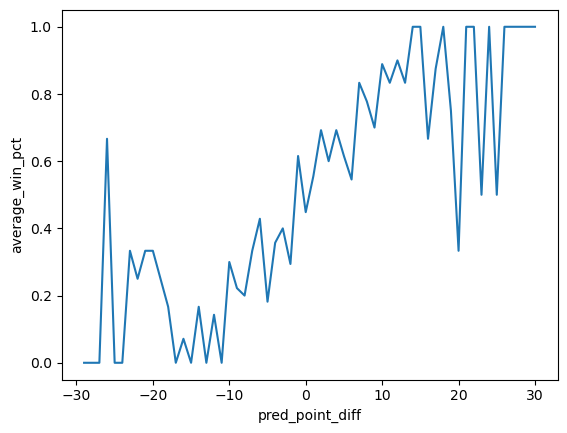

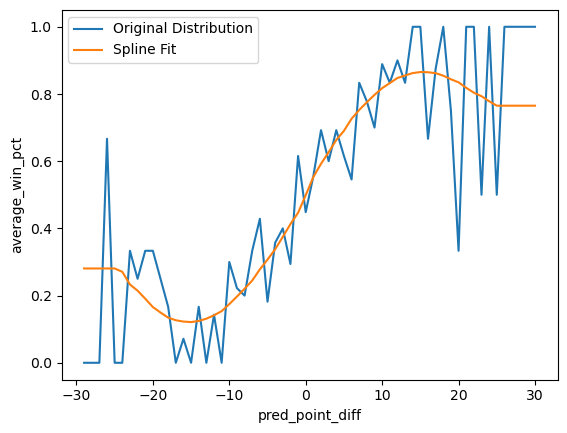

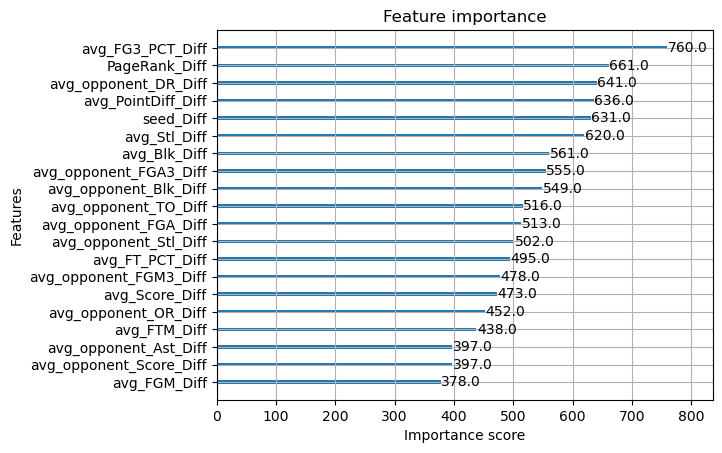

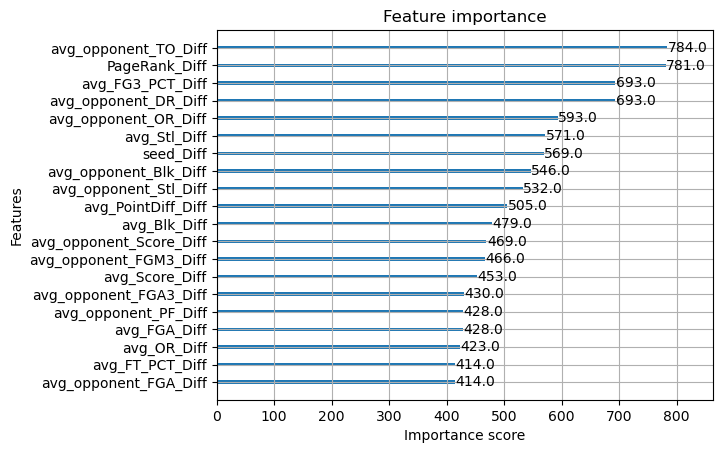

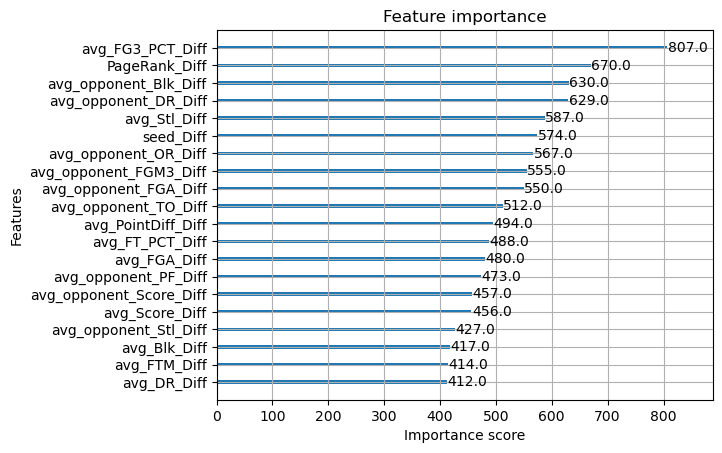

...

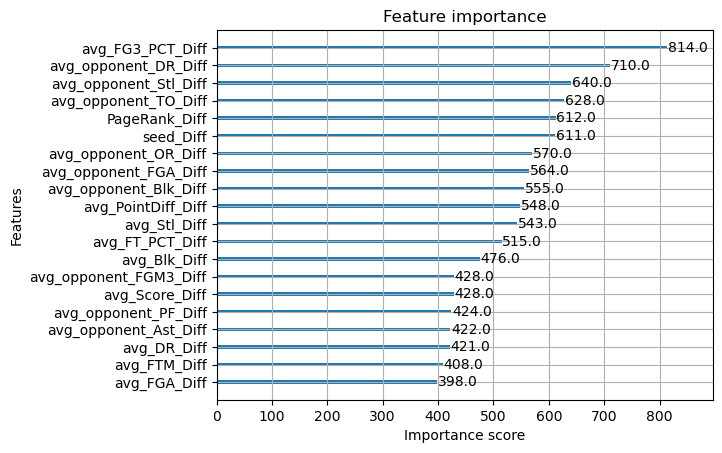

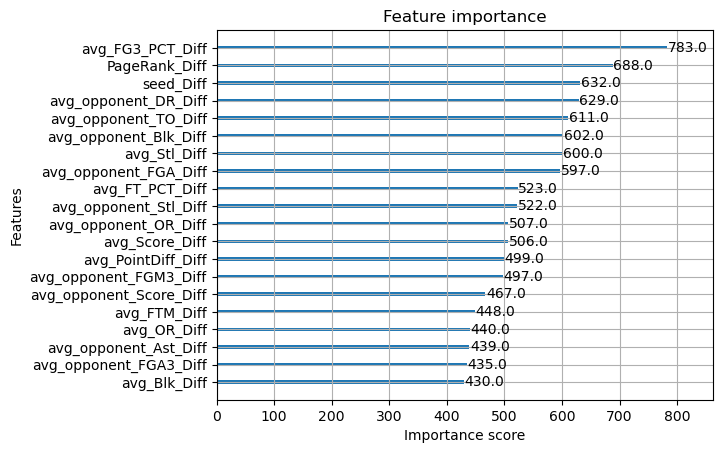

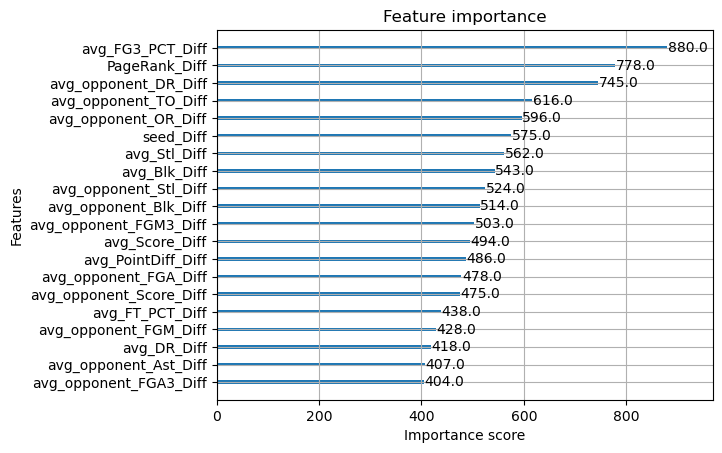

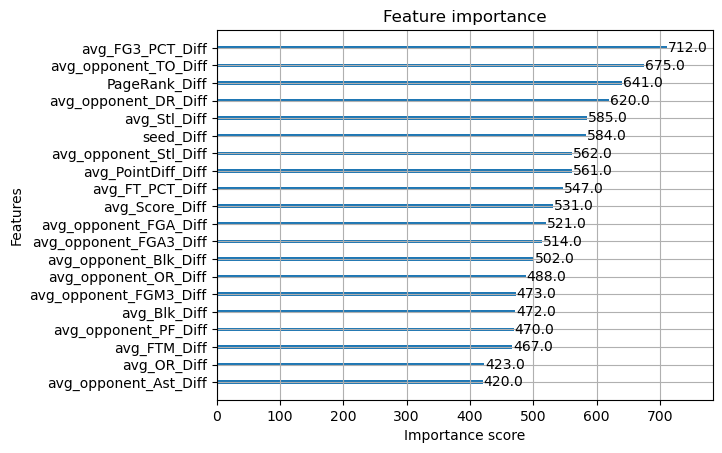

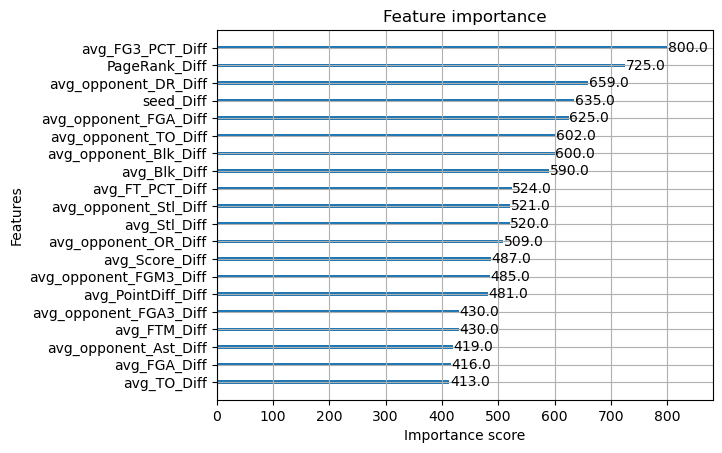

In [45]:
selected_features = [x for x in W_sweet_onwards_data.columns if x.endswith("_Diff")]

param = {
    "objective": "reg:squarederror",
    "booster" : "gbtree",
    "eta" : 0.01,
    "subsample" : 0.6,
    "colsample_bynode" : 0.8,
    "num_parallel_tree" : 2,
    "min_child_weight" : 4,
    "max_depth" : 4,
    "tree_method" : "hist",
    "grow_policy" : "lossguide",
    "max_bin" : 32
}

num_rounds = 700

# Training with holdout validation - predict one year's results based on all other years

models = {}

mask_mae = []
mask_preds = []
mask_targets = []
mask_ss = []

for mask_season in set(W_sweet_onwards_data.Season):
    x_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, selected_features].values
    y_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, "PointDiff"].values

    x_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, selected_features].values
    y_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "PointDiff"].values
    season_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "Season"].values

    dtrain = xgb.DMatrix(x_train, label=y_train, feature_names=selected_features)
    dvalidation = xgb.DMatrix(x_validation, label = y_validation, feature_names=selected_features)

    models[mask_season] = xgb.train(
        params = param,
        dtrain = dtrain,
        num_boost_round = num_rounds
    )

    preds = models[mask_season].predict(dvalidation)
    print(f"Mask Season: {mask_season} MAE: {mean_absolute_error(y_validation, preds)}")

    mask_mae.append(mean_absolute_error(y_validation, preds))
    mask_preds += list(preds)
    mask_targets += list(y_validation)
    mask_ss += list(season_validation)

print(f"Average MAE:  {np.mean(mask_mae)}")

# train on each respective year, get predicted outcome, then check against actual to see how much point diff was off

# Plot a graph of average win percentage vs. predicted point differential

df = pd.DataFrame({
    "Season" : mask_ss,
    "pred" : mask_preds,
    "label" : [(t > 0) for t in mask_targets]
})

df["pred_point_diff"] = df["pred"].astype('int')

xdf = df.clip(-30,30).groupby("pred_point_diff")["label"].mean().reset_index(name = "average_win_pct")

seaborn.lineplot(x = xdf["pred_point_diff"], y = xdf["average_win_pct"])

# Fit a Curve to the jagged data derived in the average win percentage vs pred point diff graph

t = 25
dat = list(zip(mask_preds, np.array(mask_targets) > 0))
dat = sorted(dat, key = lambda x:x[0])
pred, label = list(zip(*dat))
spline_model = UnivariateSpline(np.clip(pred, -t, t), label, k = 5)
spline_fit = np.clip(spline_model(np.clip(mask_preds, -t, t)), 0.01, 0.99)
print(f"brier: {brier_score_loss(np.array(mask_targets) > 0, spline_fit)}")
df["spline"] = spline_fit
xdf = df.clip(-30,30).groupby('pred_point_diff')[['spline', 'label']].mean().reset_index()

plt.figure()
plt.xlabel("pred_point_diff")
plt.ylabel('average_win_pct')
plt.plot(xdf['pred_point_diff'], xdf['label'])
plt.plot(xdf['pred_point_diff'], xdf['spline'])
plt.legend(['Original Distribution', 'Spline Fit'])

# For each season's tournament, compute and display the brier score

avg_brier_score = 0.0
num_seasons = 0

for mask_season in set(W_sweet_onwards_data.Season):

    x = df.loc[df["Season"] == mask_season, "spline"].values
    y = df.loc[df["Season"] == mask_season, "label"].values
    print(mask_season, np.round(brier_score_loss(y,x), 5))
    avg_brier_score += brier_score_loss(y,x)
    num_seasons += 1

avg_brier_score /= num_seasons

print("average brier score: ", avg_brier_score)

for year in years:
    xgb.plot_importance(models[year], max_num_features=20)


Mask Season: 2016 MAE: 13.605159278710683
Mask Season: 2017 MAE: 14.063319573910148
Mask Season: 2018 MAE: 10.560554663009112
Mask Season: 2019 MAE: 6.613162593046824
Mask Season: 2021 MAE: 12.199446019488905
Mask Season: 2022 MAE: 7.214661339918773
Mask Season: 2023 MAE: 10.28690490325292
Mask Season: 2024 MAE: 8.732820626099905
Mask Season: 2025 MAE: 9.525691125293573
Mask Season: 2010 MAE: 13.997705127078074
Mask Season: 2011 MAE: 13.397174994150797
Mask Season: 2012 MAE: 8.691338972692135
Mask Season: 2013 MAE: 8.617018945680723
Mask Season: 2014 MAE: 11.251946177085241
Mask Season: 2015 MAE: 7.6423591869848755
Average MAE:  10.426617568426845
brier: 0.17602381824411897
2016 0.25804
2017 0.2427
2018 0.19536
2019 0.11001
2021 0.18265
2022 0.13426
2023 0.22976
2024 0.19714
2025 0.12828
2010 0.22526
2011 0.22603
2012 0.09679
2013 0.18711
2014 0.13049
2015 0.09648
average brier score:  0.176023818244119


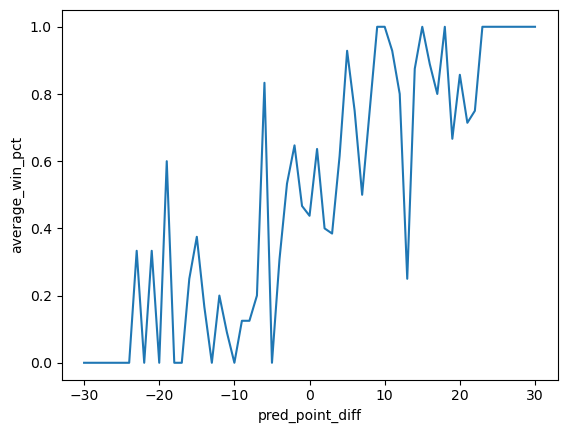

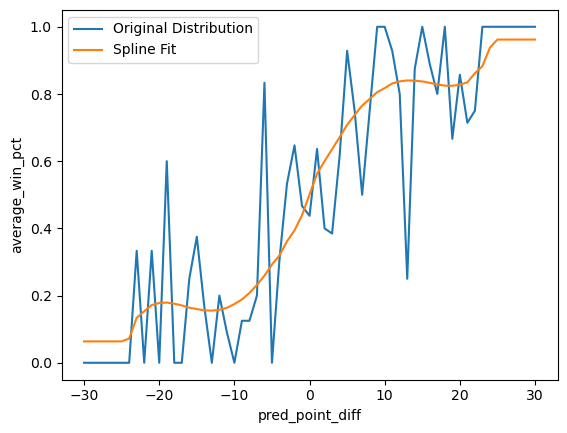

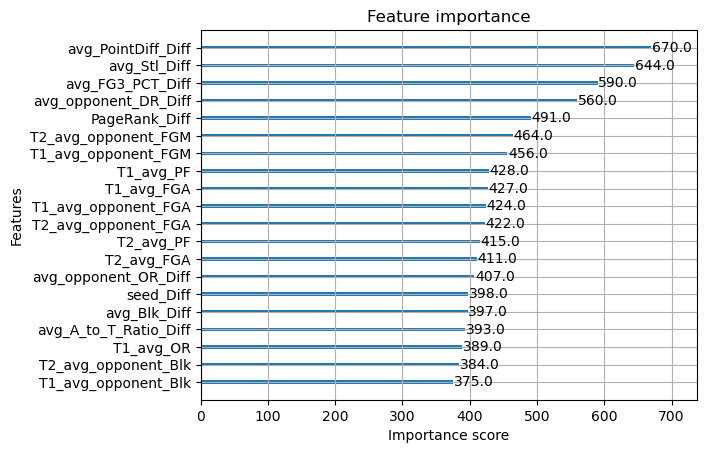

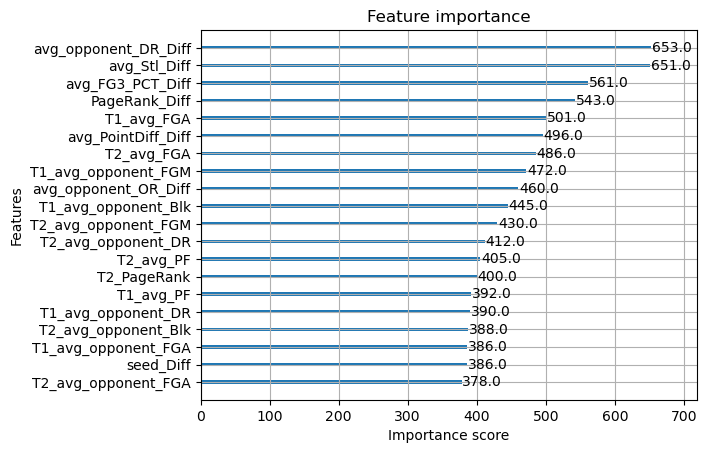

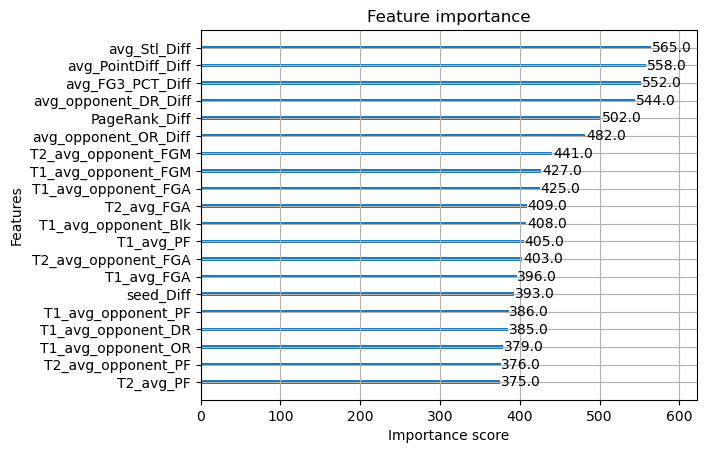

...

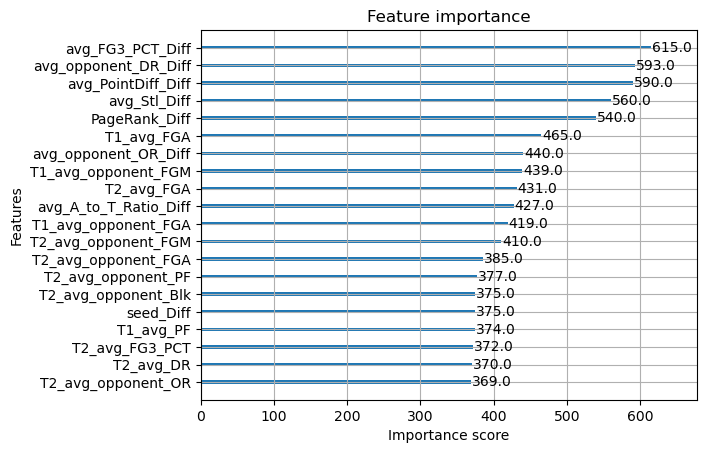

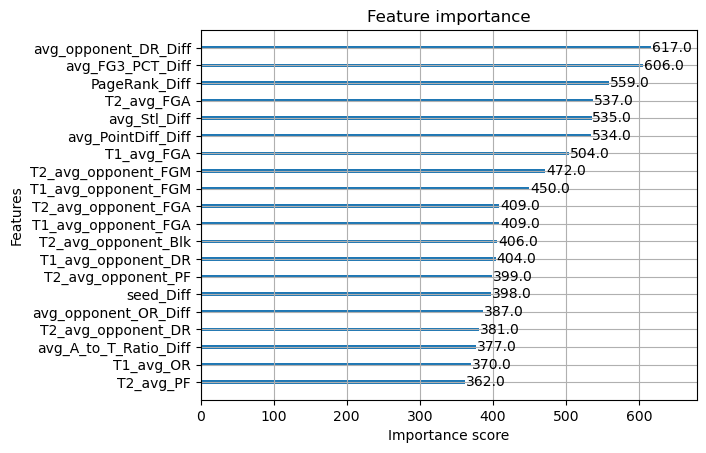

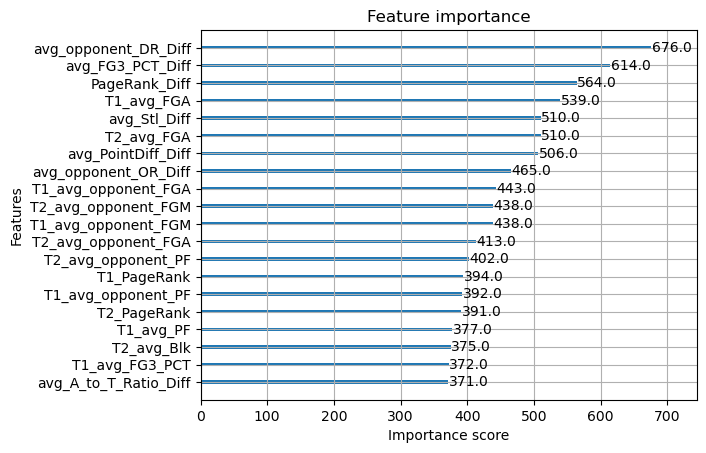

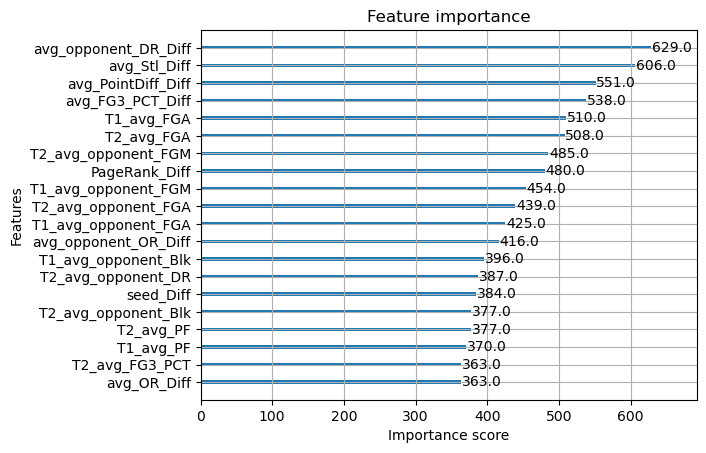

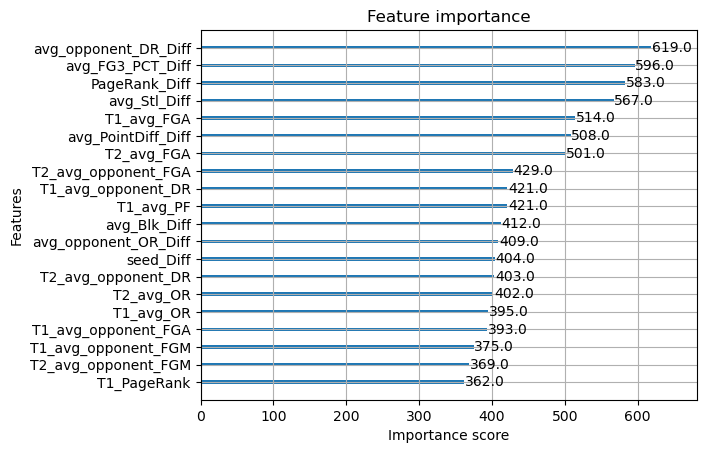

In [48]:
selected_features = ["T1_seed", 
                     "T2_seed", 
                     "seed_Diff", 
                     "T1_PageRank", "T2_PageRank",
                     "PageRank_Diff",
                     "T1_avg_Score", "T2_avg_Score",
                     "T1_avg_Blk", "T2_avg_Blk",
                     "T1_avg_PF", "T2_avg_PF",
                     "T1_avg_FGA", "T2_avg_FGA",
                     "T1_avg_opponent_FGM", "T2_avg_opponent_FGM",
                     "T1_avg_opponent_FGA", "T2_avg_opponent_FGA",
                     "T1_avg_opponent_Blk", "T2_avg_opponent_Blk",
                     "T1_avg_opponent_PF", "T2_avg_opponent_PF",
                     "T1_avg_OR", "T2_avg_OR", "avg_OR_Diff",
                     "T1_avg_DR", "T2_avg_DR", "avg_DR_Diff",
                     "T1_avg_opponent_OR", "T2_avg_opponent_OR", "avg_opponent_OR_Diff",
                     "T1_avg_opponent_DR", "T2_avg_opponent_DR", "avg_opponent_DR_Diff",
                     "T1_avg_FG3_PCT", "T2_avg_FG3_PCT", "avg_FG3_PCT_Diff",
                     "T1_avg_PointDiff", "T2_avg_PointDiff", "avg_PointDiff_Diff",
                     "avg_A_to_T_Ratio_Diff", "avg_Stl_Diff", "avg_Blk_Diff"
                     ]

param = {
    "objective": "reg:squarederror",
    "booster" : "gbtree",
    "eta" : 0.01,
    "subsample" : 0.6,
    "colsample_bynode" : 0.8,
    "num_parallel_tree" : 2,
    "min_child_weight" : 4,
    "max_depth" : 4,
    "tree_method" : "hist",
    "grow_policy" : "lossguide",
    "max_bin" : 32
}

num_rounds = 700

# Training with holdout validation - predict one year's results based on all other years

models = {}

mask_mae = []
mask_preds = []
mask_targets = []
mask_ss = []

for mask_season in set(W_sweet_onwards_data.Season):
    x_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, selected_features].values
    y_train = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] != mask_season, "PointDiff"].values

    x_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, selected_features].values
    y_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "PointDiff"].values
    season_validation = W_sweet_onwards_data.loc[W_sweet_onwards_data["Season"] == mask_season, "Season"].values

    dtrain = xgb.DMatrix(x_train, label=y_train, feature_names=selected_features)
    dvalidation = xgb.DMatrix(x_validation, label = y_validation, feature_names=selected_features)

    models[mask_season] = xgb.train(
        params = param,
        dtrain = dtrain,
        num_boost_round = num_rounds
    )

    preds = models[mask_season].predict(dvalidation)
    print(f"Mask Season: {mask_season} MAE: {mean_absolute_error(y_validation, preds)}")

    mask_mae.append(mean_absolute_error(y_validation, preds))
    mask_preds += list(preds)
    mask_targets += list(y_validation)
    mask_ss += list(season_validation)

print(f"Average MAE:  {np.mean(mask_mae)}")

# train on each respective year, get predicted outcome, then check against actual to see how much point diff was off

# Plot a graph of average win percentage vs. predicted point differential

df = pd.DataFrame({
    "Season" : mask_ss,
    "pred" : mask_preds,
    "label" : [(t > 0) for t in mask_targets]
})

df["pred_point_diff"] = df["pred"].astype('int')

xdf = df.clip(-30,30).groupby("pred_point_diff")["label"].mean().reset_index(name = "average_win_pct")

seaborn.lineplot(x = xdf["pred_point_diff"], y = xdf["average_win_pct"])

# Fit a Curve to the jagged data derived in the average win percentage vs pred point diff graph

t = 25
dat = list(zip(mask_preds, np.array(mask_targets) > 0))
dat = sorted(dat, key = lambda x:x[0])
pred, label = list(zip(*dat))
spline_model = UnivariateSpline(np.clip(pred, -t, t), label, k = 5)
spline_fit = np.clip(spline_model(np.clip(mask_preds, -t, t)), 0.01, 0.99)
print(f"brier: {brier_score_loss(np.array(mask_targets) > 0, spline_fit)}")
df["spline"] = spline_fit
xdf = df.clip(-30,30).groupby('pred_point_diff')[['spline', 'label']].mean().reset_index()

plt.figure()
plt.xlabel("pred_point_diff")
plt.ylabel('average_win_pct')
plt.plot(xdf['pred_point_diff'], xdf['label'])
plt.plot(xdf['pred_point_diff'], xdf['spline'])
plt.legend(['Original Distribution', 'Spline Fit'])

# For each season's tournament, compute and display the brier score

avg_brier_score = 0.0
num_seasons = 0

for mask_season in set(W_sweet_onwards_data.Season):

    x = df.loc[df["Season"] == mask_season, "spline"].values
    y = df.loc[df["Season"] == mask_season, "label"].values
    print(mask_season, np.round(brier_score_loss(y,x), 5))
    avg_brier_score += brier_score_loss(y,x)
    num_seasons += 1

avg_brier_score /= num_seasons

print("average brier score: ", avg_brier_score)

for year in years:
    xgb.plot_importance(models[year], max_num_features=20)
